What is EDA?

In statistics, exploratory data analysis (EDA) is an approach to analyzing data sets to summarize their main characteristics, often with visual methods. A statistical model can be used or not, but primarily EDA is for seeing what the data can tell us beyond the formal modeling or hypothesis testing task.

In [349]:
import numpy as np #numerical python
import pandas as pd 
from subprocess import check_output

import matplotlib

import numpy as np
# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns  #to plot graph
sns.set_style('whitegrid')
import plotly
from plotly import tools
from sklearn import preprocessing


#Scaling
from sklearn.preprocessing import StandardScaler   #standardize features
from sklearn.preprocessing import LabelEncoder     #normalise label

#Train Test Split
from sklearn.model_selection import train_test_split

# Models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC                  

#Evaluation 
from sklearn.metrics import classification_report   #quality of prediction
from sklearn.metrics import confusion_matrix,accuracy_score    #accuracy of classification
from sklearn.model_selection import cross_val_score    #cross validation

In [350]:
df=pd.read_excel("/content/Student Data(Shubham)_(Normalized data).xlsx")

In [351]:
df.head()

,Timestamp,email_address,full_name,prn_number,roll_number,age,gender,current_address,permanent_address,department,...,domain_of_edi_topic,edi_topic,paid_unpaid_head,Name_of_the_club_chapter,clubs_joined,avg_time_on_social_media,social_media,hobbies,how_you_spend_free_time,fees
0,2023-01-02 19:11:09.795,shrunad18@gmail.com,shruti atul nadgauda,rbt21cs005,cs2105,19,female,tathawade,indapur,computer,...,cloud,not finalled yet,yes,"ieee, nss, yin",3,2.0,youtube,writing,sleep,200000.0
1,2023-01-02 19:11:39.813,samarthpatil223@gmail.com,samarth akash patil,rbt21cs011,cs2111,19,male,marunji,marunji,computer,...,"ai,ml and app",physio at home,yes,rotract,1,2.0,instagram,workout,exercise,63405.0
2,2023-01-02 19:11:49.871,alishatamboli57@gmail.com,alisha akbar tamboli,rbt21cs066,cs2165,20,female,tathawade,paranda,computer,...,blockchain,financial literacy and monthly budget planning,unpiad_member,nss,1,1.0,instagram,learning,reading,63000.0
3,2023-01-02 19:12:17.026,pawarparmeshvar2019@gmail.com,pawar parmeshvar ramchandra,rbt20cs016,cs3106,20,male,tathawade,beed,computer,...,computervision,advanced driver assistance system,unpiad_member,"rangbhumi,iei",2,1.0,youtube,reading,"reading, movies",64395.0
4,2023-01-02 19:13:26.692,sp15032002@gmail.com,shreya pranath panicker,rbt20cs132,cs3148,20,female,dehuroad,dehuroad,computer,...,Iot,iot based intelligent headgear system based on...,unpiad_member,"acm, astro",2,0.5,youtube,drawing,"reading, drawing",112290.0


In [352]:
df.shape

(103, 29)

In [353]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 103 non-null    datetime64[ns]
 1   email_address             103 non-null    object        
 2   full_name                 103 non-null    object        
 3   prn_number                103 non-null    object        
 4   roll_number               103 non-null    object        
 5   age                       103 non-null    int64         
 6   gender                    103 non-null    object        
 7   current_address           103 non-null    object        
 8   permanent_address         103 non-null    object        
 9   department                103 non-null    object        
 10  year                      103 non-null    object        
 11  division                  103 non-null    object        
 12  cgpa                  

In [354]:
df.describe(include='all')

<ipython-input-354-174ba9bf1a5c>:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.



,Timestamp,email_address,full_name,prn_number,roll_number,age,gender,current_address,permanent_address,department,...,domain_of_edi_topic,edi_topic,paid_unpaid_head,Name_of_the_club_chapter,clubs_joined,avg_time_on_social_media,social_media,hobbies,how_you_spend_free_time,fees
count,103,103,103,103,103,103.000000,103,103,103,103,...,103,103,103,103,103.000000,101.000000,103,103,102,102.000000
unique,103,103,103,103,95,NaN,2,30,53,1,...,44,95,3,40,NaN,NaN,5,54,69,NaN
top,2023-01-02 19:11:09.795000,shrunad18@gmail.com,shruti atul nadgauda,rbt21cs005,cs2123,NaN,male,tathawade,satara,computer,...,ml,smart campus,yes,na,NaN,NaN,youtube,cricket,games,NaN
freq,1,1,1,1,2,NaN,66,51,7,103,...,14,3,60,16,NaN,NaN,45,8,10,NaN
first,2023-01-02 19:11:09.795000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2023-01-06 15:39:48.436000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,19.980583,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.174757,2.205149,NaN,NaN,NaN,72697.137255
std,NaN,NaN,NaN,NaN,NaN,1.057008,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.833457,1.574867,NaN,NaN,NaN,40472.371656
min,NaN,NaN,NaN,NaN,NaN,18.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.250000,NaN,NaN,NaN,190.000000
25%,NaN,NaN,NaN,NaN,NaN,19.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,61963.000000


In [355]:
df.describe()

,age,cgpa,sgpa,10th_percentage,clubs_joined,avg_time_on_social_media,fees
count,103.000000,103.000000,103.000000,103.000000,103.000000,101.000000,102.000000
mean,19.980583,8.550097,8.503689,88.270583,1.174757,2.205149,72697.137255
std,1.057008,1.606177,1.437702,6.564488,0.833457,1.574867,40472.371656
min,18.000000,0.000000,0.000000,60.000000,0.000000,0.250000,190.000000
25%,19.000000,8.410000,8.070000,86.000000,1.000000,1.000000,61963.000000
50%,20.000000,8.800000,8.700000,90.000000,1.000000,2.000000,63495.000000
75%,21.000000,9.325000,9.210000,92.400000,1.000000,3.000000,112190.000000
max,24.000000,9.870000,10.000000,97.600000,5.000000,10.000000,200000.000000


In [356]:
df["diploma_percentage"].value_counts()

na       95
86.69     1
91.93     1
93.6      1
94.23     1
92.5      1
75.38     1
94.63     1
89.2      1
Name: diploma_percentage, dtype: int64

In [357]:
df['diploma_percentage'] = df['diploma_percentage'].replace('na', np.nan)

# Convert to integer
df['diploma_percentage'] = df['diploma_percentage'].astype(float)

# Print the result
df["diploma_percentage"].value_counts()

86.69    1
91.93    1
93.60    1
94.23    1
92.50    1
75.38    1
94.63    1
89.20    1
Name: diploma_percentage, dtype: int64

In [358]:
df.describe()

,age,cgpa,sgpa,10th_percentage,diploma_percentage,clubs_joined,avg_time_on_social_media,fees
count,103.000000,103.000000,103.000000,103.000000,8.000000,103.000000,101.000000,102.000000
mean,19.980583,8.550097,8.503689,88.270583,89.770000,1.174757,2.205149,72697.137255
std,1.057008,1.606177,1.437702,6.564488,6.405154,0.833457,1.574867,40472.371656
min,18.000000,0.000000,0.000000,60.000000,75.380000,0.000000,0.250000,190.000000
25%,19.000000,8.410000,8.070000,86.000000,88.572500,1.000000,1.000000,61963.000000
50%,20.000000,8.800000,8.700000,90.000000,92.215000,1.000000,2.000000,63495.000000
75%,21.000000,9.325000,9.210000,92.400000,93.757500,1.000000,3.000000,112190.000000
max,24.000000,9.870000,10.000000,97.600000,94.630000,5.000000,10.000000,200000.000000


In [359]:
df.isna().sum()

Timestamp                    0
email_address                0
full_name                    0
prn_number                   0
roll_number                  0
age                          0
gender                       0
current_address              0
permanent_address            0
department                   0
year                         0
division                     0
cgpa                         0
sgpa                         0
10th_percentage              0
12th_percentage              0
diploma_percentage          95
certification                0
certification_platform       0
domain_of_edi_topic          0
edi_topic                    0
paid_unpaid_head             0
Name_of_the_club_chapter     0
clubs_joined                 0
avg_time_on_social_media     2
social_media                 0
hobbies                      0
how_you_spend_free_time      1
fees                         1
dtype: int64

In [360]:
df.isnull().sum()

Timestamp                    0
email_address                0
full_name                    0
prn_number                   0
roll_number                  0
age                          0
gender                       0
current_address              0
permanent_address            0
department                   0
year                         0
division                     0
cgpa                         0
sgpa                         0
10th_percentage              0
12th_percentage              0
diploma_percentage          95
certification                0
certification_platform       0
domain_of_edi_topic          0
edi_topic                    0
paid_unpaid_head             0
Name_of_the_club_chapter     0
clubs_joined                 0
avg_time_on_social_media     2
social_media                 0
hobbies                      0
how_you_spend_free_time      1
fees                         1
dtype: int64

In [361]:
df['age'].value_counts()

20    39
19    32
21    21
22     5
18     4
24     1
23     1
Name: age, dtype: int64

Age
 20    39
19    32
21    21
22     5
18     4
24     1
23     1
Name: age, dtype: int64


<Figure size 1000x1000 with 0 Axes>

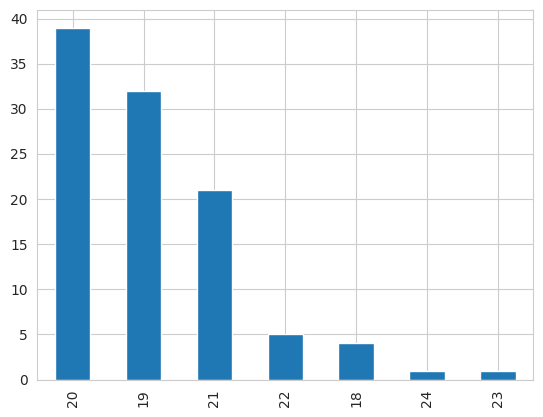

<Figure size 1000x1000 with 0 Axes>

In [362]:
print('Age\n',df.age.value_counts(normalize=False))
df.age.value_counts(normalize=False).plot(kind='bar')
plt.figure(figsize=(10, 10))

Unique values in the given column: 7
Age
 20    0.378641
19    0.310680
21    0.203883
22    0.048544
18    0.038835
24    0.009709
23    0.009709
Name: age, dtype: float64


<Figure size 1000x1000 with 0 Axes>

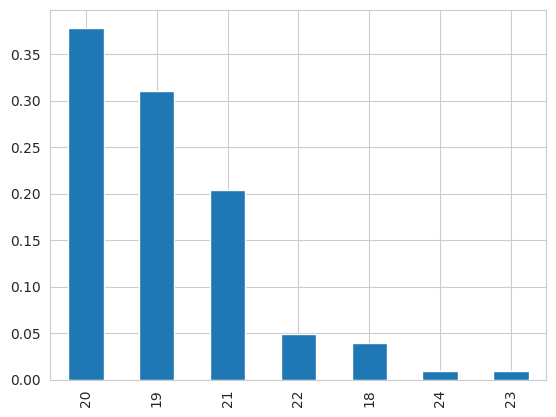

<Figure size 1000x1000 with 0 Axes>

In [363]:
print("Unique values in the given column:",df['age'].nunique())
print('Age\n',df.age.value_counts(normalize=True))
df.age.value_counts(normalize=True).plot(kind='bar')
plt.figure(figsize=(10, 10))

In [364]:
df['gender'].value_counts()

male      66
female    37
Name: gender, dtype: int64

Unique values in the given column: 2
Gender
 male      0.640777
female    0.359223
Name: gender, dtype: float64


<Figure size 1000x1000 with 0 Axes>

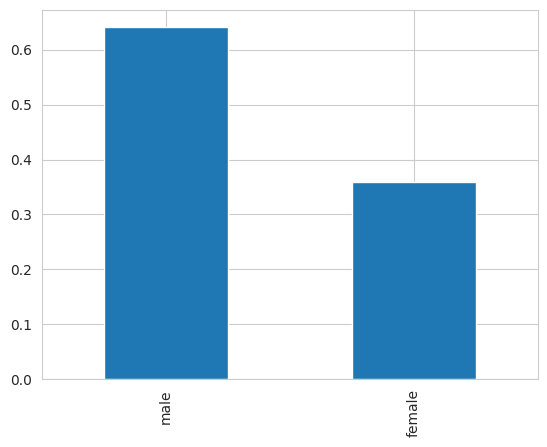

<Figure size 1000x1000 with 0 Axes>

In [365]:
print("Unique values in the given column:",df['gender'].nunique())
print('Gender\n',df.gender.value_counts(normalize=True))
df.gender.value_counts(normalize=True).plot(kind='bar')
plt.figure(figsize=(10, 10))

In [366]:
df['current_address'].value_counts()

tathawade           51
pimpri-chinchwad     6
pune                 4
ravet                4
chinchwad            4
akurdi               4
pimple nilakh        3
pimpri               2
pashan               2
punawale             2
wakad                2
hinjewadi            1
talab-tillo          1
nigdi                1
baner                1
katraj               1
old sangvi           1
dange-chowk          1
balewadi             1
thergaon             1
walhekarwadi         1
chikhali             1
marunji              1
kothrud              1
moshi                1
bijali Nagar         1
satara               1
aundh                1
dehuroad             1
pimple gurav         1
Name: current_address, dtype: int64

Unique values in the given column: 30
Current Address
 tathawade           0.495146
pimpri-chinchwad    0.058252
pune                0.038835
ravet               0.038835
chinchwad           0.038835
akurdi              0.038835
pimple nilakh       0.029126
pimpri              0.019417
pashan              0.019417
punawale            0.019417
wakad               0.019417
hinjewadi           0.009709
talab-tillo         0.009709
nigdi               0.009709
baner               0.009709
katraj              0.009709
old sangvi          0.009709
dange-chowk         0.009709
balewadi            0.009709
thergaon            0.009709
walhekarwadi        0.009709
chikhali            0.009709
marunji             0.009709
kothrud             0.009709
moshi               0.009709
bijali Nagar        0.009709
satara              0.009709
aundh               0.009709
dehuroad            0.009709
pimple gurav        0.009709
Name: current_address, dtype: float64


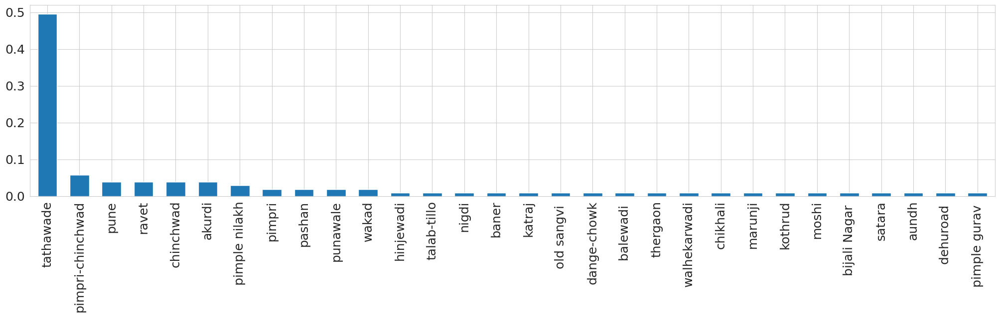

In [367]:
print("Unique values in the given column:",df['current_address'].nunique())
print('Current Address\n',df.current_address.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.current_address.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [368]:
df['permanent_address'].value_counts()

satara              7
beed                6
jalgaon             6
ahmednagar          6
tathawade           5
chinchwad           5
nashik              4
aurangabad          4
pimpri-chinchwad    4
pimple nilakh       3
sangli              2
nandurbar           2
pimpri              2
akurdi              2
barshi              2
hingoli             2
pashan              2
narayangaon         2
ravet               2
udgir               2
balewadi            1
jalna               1
old sangvi          1
pimple gurav        1
wakad               1
kalyan              1
velapur             1
pathardi phata      1
shirur              1
paithan             1
baner               1
mohol               1
nigdi               1
hinganghat          1
indapur             1
pune                1
omerga              1
paranda             1
dehuroad            1
aundh               1
kolhapur            1
moshi               1
belgaum             1
osmanabad           1
roha                1
kingaon ra

Unique values in the given column: 53
Permanent Address
 satara              0.067961
beed                0.058252
jalgaon             0.058252
ahmednagar          0.058252
tathawade           0.048544
chinchwad           0.048544
nashik              0.038835
aurangabad          0.038835
pimpri-chinchwad    0.038835
pimple nilakh       0.029126
sangli              0.019417
nandurbar           0.019417
pimpri              0.019417
akurdi              0.019417
barshi              0.019417
hingoli             0.019417
pashan              0.019417
narayangaon         0.019417
ravet               0.019417
udgir               0.019417
balewadi            0.009709
jalna               0.009709
old sangvi          0.009709
pimple gurav        0.009709
wakad               0.009709
kalyan              0.009709
velapur             0.009709
pathardi phata      0.009709
shirur              0.009709
paithan             0.009709
baner               0.009709
mohol               0.009709
nigdi          

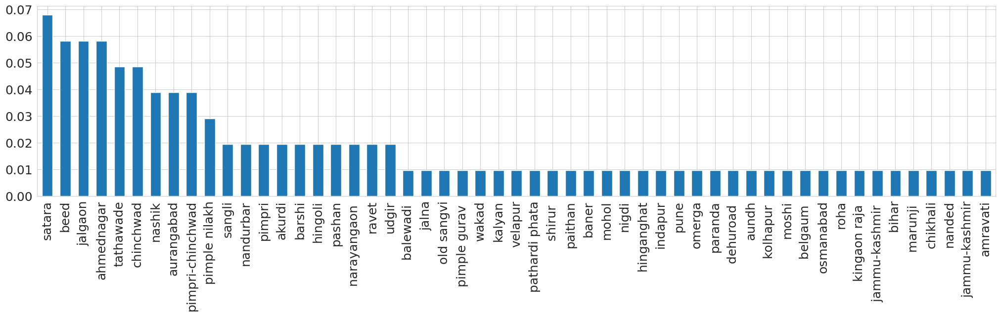

In [369]:
print("Unique values in the given column:",df['permanent_address'].nunique())
print('Permanent Address\n',df.permanent_address.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.permanent_address.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [370]:
df['department'].value_counts()

computer    103
Name: department, dtype: int64

Unique values in the given column: 1
Department
 computer    1.0
Name: department, dtype: float64


<Figure size 1000x1000 with 0 Axes>

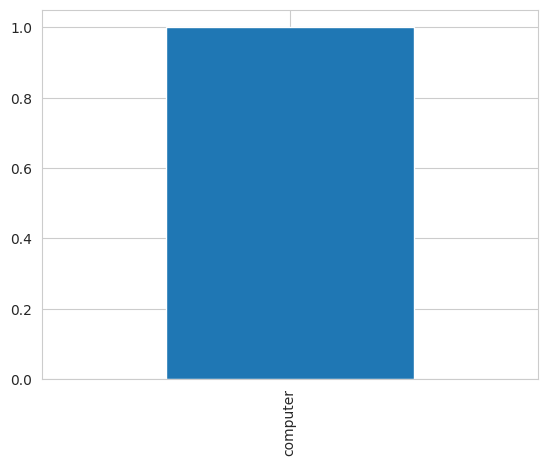

<Figure size 1000x1000 with 0 Axes>

In [371]:
print("Unique values in the given column:",df['department'].nunique())
print('Department\n',df.department.value_counts(normalize=True))
df.department.value_counts(normalize=True).plot(kind='bar')
plt.figure(figsize=(10, 10))

In [372]:
df['year'].value_counts()

sy    42
ty    41
be    20
Name: year, dtype: int64

Unique values in the given column: 3
Year in which the student study
 sy    0.407767
ty    0.398058
be    0.194175
Name: year, dtype: float64


<Figure size 1000x1000 with 0 Axes>

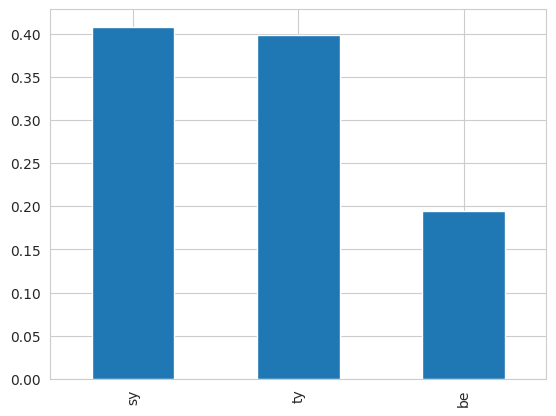

<Figure size 1000x1000 with 0 Axes>

In [373]:
print("Unique values in the given column:",df['year'].nunique())
print('Year in which the student study\n',df.year.value_counts(normalize=True))
df.year.value_counts(normalize=True).plot(kind='bar')
plt.figure(figsize=(10, 10))

In [374]:
df['division'].value_counts()

a        76
b        20
csbs      5
other     2
Name: division, dtype: int64

Unique values in the given column: 4
Division
 a        0.737864
b        0.194175
csbs     0.048544
other    0.019417
Name: division, dtype: float64


<Figure size 1000x1000 with 0 Axes>

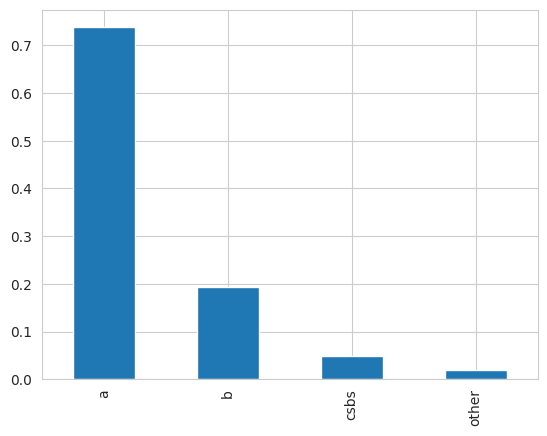

<Figure size 1000x1000 with 0 Axes>

In [375]:
print("Unique values in the given column:",df['division'].nunique())
print('Division\n',df.division.value_counts(normalize=True))
df.division.value_counts(normalize=True).plot(kind='bar')
plt.figure(figsize=(10, 10))

In [376]:
df["cgpa"].value_counts()

8.50    3
9.04    3
8.70    3
8.00    3
8.90    3
       ..
7.25    1
8.52    1
9.38    1
9.87    1
8.65    1
Name: cgpa, Length: 73, dtype: int64

In [377]:
# df['cgpa'] = pd.to_numeric(df['cgpa'], errors='coerce')
# # Replace 'na' values in 'cgpa' column with NaN values
# df['cgpa'] = df['cgpa'].replace('na', np.nan)

# # Convert 'sgpa' column to float data type
# df['cgpa'] = df['cgpa'].astype(float)


In [378]:
df['cgpa'] = pd.to_numeric(df['cgpa'], errors='coerce')

# Replace NaN values in 'cgpa' column with 0
df['cgpa'] = df['cgpa'].fillna(0)

# Print the modified dataframe
print(df['cgpa'])

0      8.10
1      8.90
2      9.57
3      8.74
4      9.00
       ... 
98     8.50
99     8.70
100    9.75
101    8.97
102    8.65
Name: cgpa, Length: 103, dtype: float64


Unique values in the given column: 73
CGPA
 8.50    0.029126
9.04    0.029126
8.70    0.029126
8.00    0.029126
8.90    0.029126
          ...   
7.25    0.009709
8.52    0.009709
9.38    0.009709
9.87    0.009709
8.65    0.009709
Name: cgpa, Length: 73, dtype: float64


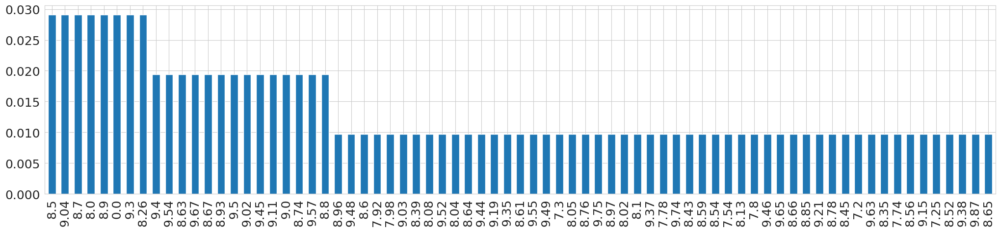

In [379]:
print("Unique values in the given column:",df['cgpa'].nunique())
print('CGPA\n',df.cgpa.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.cgpa.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [380]:
df["sgpa"].value_counts()

9.78    7
9.00    5
8.70    5
8.30    5
7.80    3
       ..
8.80    1
7.70    1
8.02    1
8.60    1
8.39    1
Name: sgpa, Length: 64, dtype: int64

In [381]:
df['sgpa'] = df['sgpa'].replace('na', np.nan)

# Convert to float
df['sgpa'] = df['sgpa'].astype(float)

Unique values in the given column: 64
SGPA
 9.78    0.067961
9.00    0.048544
8.70    0.048544
8.30    0.048544
7.80    0.029126
          ...   
8.80    0.009709
7.70    0.009709
8.02    0.009709
8.60    0.009709
8.39    0.009709
Name: sgpa, Length: 64, dtype: float64


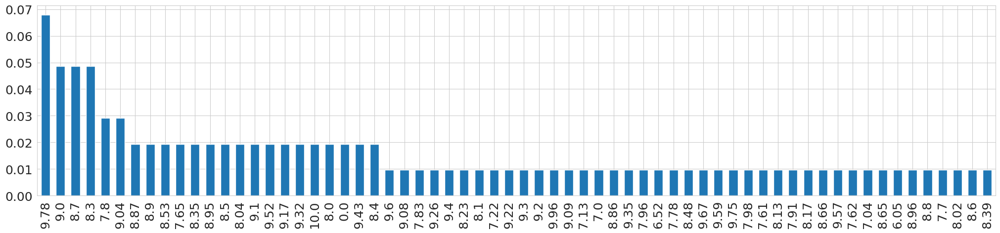

In [382]:
print("Unique values in the given column:",df['sgpa'].nunique())
print('SGPA\n',df.sgpa.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.sgpa.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [383]:
df["10th_percentage"].value_counts()

88.00    6
85.00    5
89.00    5
90.00    3
87.00    3
92.00    3
92.80    3
93.20    3
92.40    3
91.00    3
75.00    2
94.00    2
90.60    2
89.20    2
93.60    2
91.20    2
94.60    2
90.80    2
91.80    2
84.00    2
93.80    2
95.00    2
90.20    2
80.40    2
96.80    2
92.20    2
81.00    2
91.60    2
88.88    1
91.50    1
67.20    1
88.60    1
60.00    1
70.00    1
86.20    1
80.60    1
96.00    1
78.00    1
86.60    1
76.00    1
95.40    1
94.20    1
89.89    1
74.80    1
92.60    1
73.40    1
91.40    1
85.80    1
89.30    1
95.80    1
97.60    1
93.00    1
81.70    1
83.00    1
87.60    1
88.40    1
79.40    1
84.20    1
Name: 10th_percentage, dtype: int64

Unique values in the given column: 58
10th Percentage
 88.00    0.058252
85.00    0.048544
89.00    0.048544
90.00    0.029126
87.00    0.029126
92.00    0.029126
92.80    0.029126
93.20    0.029126
92.40    0.029126
91.00    0.029126
75.00    0.019417
94.00    0.019417
90.60    0.019417
89.20    0.019417
93.60    0.019417
91.20    0.019417
94.60    0.019417
90.80    0.019417
91.80    0.019417
84.00    0.019417
93.80    0.019417
95.00    0.019417
90.20    0.019417
80.40    0.019417
96.80    0.019417
92.20    0.019417
81.00    0.019417
91.60    0.019417
88.88    0.009709
91.50    0.009709
67.20    0.009709
88.60    0.009709
60.00    0.009709
70.00    0.009709
86.20    0.009709
80.60    0.009709
96.00    0.009709
78.00    0.009709
86.60    0.009709
76.00    0.009709
95.40    0.009709
94.20    0.009709
89.89    0.009709
74.80    0.009709
92.60    0.009709
73.40    0.009709
91.40    0.009709
85.80    0.009709
89.30    0.009709
95.80    0.009709
97.60    0.009709
93.00    0.009709
81.70    

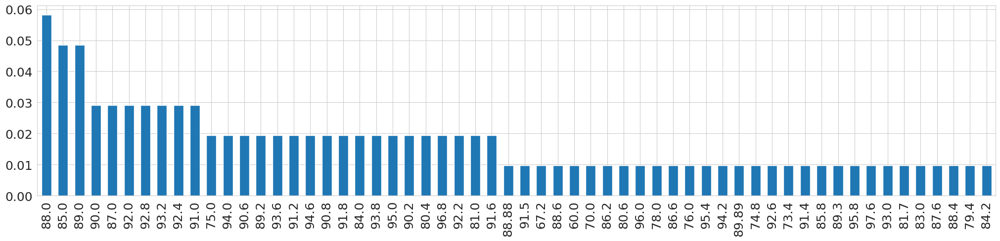

In [384]:
print("Unique values in the given column:",df['10th_percentage'].nunique())
df = df.rename(columns={'10th_percentage': 'percentage_10th'})
print('10th Percentage\n',df.percentage_10th.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.percentage_10th.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [385]:
df["12th_percentage"].value_counts()

na       10
90        4
87        3
80        3
73        2
         ..
88.15     1
71        1
91.17     1
73.85     1
78.94     1
Name: 12th_percentage, Length: 81, dtype: int64

In [386]:
df['12th_percentage'] = df['12th_percentage'].replace('na', np.nan)

# Convert to integer
df['12th_percentage'] = df['12th_percentage'].astype(float)

# Print the result
df["12th_percentage"].value_counts()

90.00    4
80.00    3
87.00    3
77.00    2
83.00    2
        ..
88.15    1
71.00    1
91.17    1
73.85    1
78.94    1
Name: 12th_percentage, Length: 80, dtype: int64

Unique values in the given column: 80
12th Percentage
 90.00    0.043011
80.00    0.032258
87.00    0.032258
77.00    0.021505
83.00    0.021505
           ...   
88.15    0.010753
71.00    0.010753
91.17    0.010753
73.85    0.010753
78.94    0.010753
Name: percentage_12th, Length: 80, dtype: float64


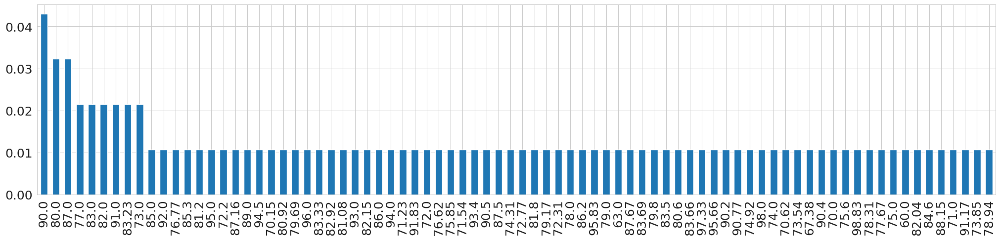

In [387]:
print("Unique values in the given column:",df['12th_percentage'].nunique())
df = df.rename(columns={'12th_percentage': 'percentage_12th'})
print('12th Percentage\n',df.percentage_12th.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.percentage_12th.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [388]:
df["diploma_percentage"].value_counts()

86.69    1
91.93    1
93.60    1
94.23    1
92.50    1
75.38    1
94.63    1
89.20    1
Name: diploma_percentage, dtype: int64

Unique values in the given column: 8
Diploma Percentage
 86.69    0.125
91.93    0.125
93.60    0.125
94.23    0.125
92.50    0.125
75.38    0.125
94.63    0.125
89.20    0.125
Name: diploma_percentage, dtype: float64


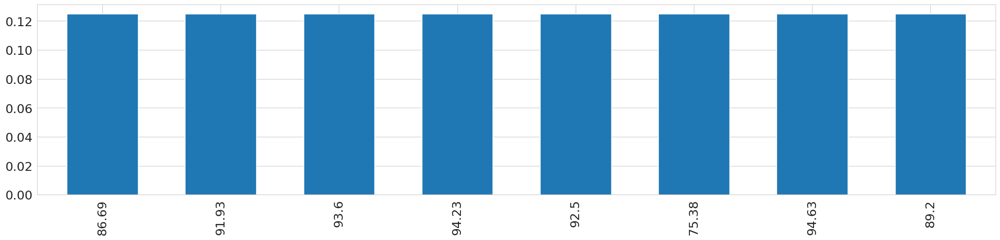

In [389]:
print("Unique values in the given column:",df['diploma_percentage'].nunique())
print('Diploma Percentage\n',df.diploma_percentage.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.diploma_percentage.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [390]:
df["certification"].value_counts()

python                                       21
cloud                                        10
web development                              10
java                                          6
dsa                                           6
machine learning                              6
na                                            5
c++                                           5
ict                                           4
networking                                    2
ethical hacking                               2
web design                                    2
cybersecurity                                 2
html                                          2
alpha- apna college                           1
artificial intelligence                       1
solidity                                      1
comptia a+                                    1
flutter                                       1
computer fundamentals                         1
curiousjr                               

In [391]:
#trying to remove the na/nan value from  the certification row
df['certification'] = df['certification'].replace('na', np.nan)

# Convert to integer
df['certification'] = df['certification'].astype(str)

df['certification'].dropna(inplace=True)

# Print the result
df["certification"].value_counts()

python                                       21
cloud                                        10
web development                              10
java                                          6
dsa                                           6
machine learning                              6
nan                                           5
c++                                           5
ict                                           4
networking                                    2
ethical hacking                               2
web design                                    2
cybersecurity                                 2
html                                          2
alpha- apna college                           1
artificial intelligence                       1
solidity                                      1
comptia a+                                    1
flutter                                       1
computer fundamentals                         1
curiousjr                               

In [392]:
print("Unique values in the given column:",df['certification'].nunique())

Unique values in the given column: 34


Unique values in the given column: 34
Certification done by Students
 python                                       0.203883
cloud                                        0.097087
web development                              0.097087
java                                         0.058252
dsa                                          0.058252
machine learning                             0.058252
nan                                          0.048544
c++                                          0.048544
ict                                          0.038835
networking                                   0.019417
ethical hacking                              0.019417
web design                                   0.019417
cybersecurity                                0.019417
html                                         0.019417
alpha- apna college                          0.009709
artificial intelligence                      0.009709
solidity                                     0.009709
comptia a+  

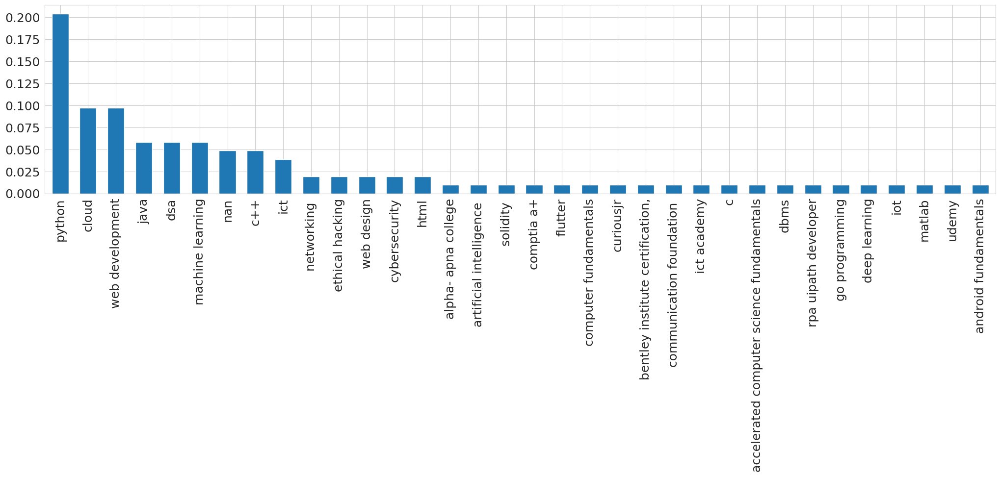

In [393]:
print("Unique values in the given column:",df['certification'].nunique())
print('Certification done by Students\n',df.certification.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.certification.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [394]:
df["certification_platform"].value_counts()

udemy                61
other                20
coursera             13
linkedin learning     7
coding ninja          2
Name: certification_platform, dtype: int64

Unique values in the given column: 5
Certification platform used by Students
 udemy                0.592233
other                0.194175
coursera             0.126214
linkedin learning    0.067961
coding ninja         0.019417
Name: certification_platform, dtype: float64


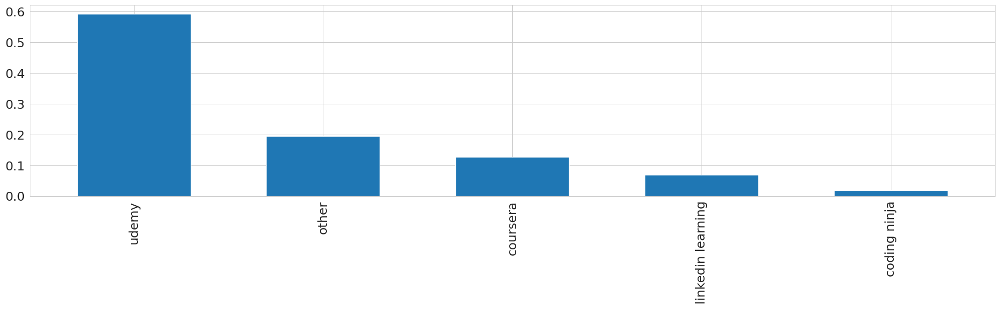

In [395]:
print("Unique values in the given column:",df['certification_platform'].nunique())
print('Certification platform used by Students\n',df.certification_platform.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.certification_platform.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [396]:
df["domain_of_edi_topic"].value_counts()

ml                            14
iot                           10
ai and ml                      9
blockchain                     7
ar                             5
ml and app                     5
app                            4
cloud                          4
dl                             3
data science and ml            2
cybersecurity                  2
blockchain                     2
ml and nlp                     2
ai,ml and app                  2
web                            2
education                      2
blockchain, app and cloud      1
 computervision and ml         1
cloud and app                  1
ml and iot                     1
 IoT                           1
ml and imageprocressing        1
ar and vr                      1
smart canteen                  1
ml and cnn                     1
app and ar                     1
ai and app                     1
cloud, web and blockchain      1
al, ml and app                 1
cloud and blockchain           1
electrical

Unique values in the given column: 44
Domains:
 ml                            0.135922
iot                           0.097087
ai and ml                     0.087379
blockchain                    0.067961
ar                            0.048544
ml and app                    0.048544
app                           0.038835
cloud                         0.038835
dl                            0.029126
data science and ml           0.019417
cybersecurity                 0.019417
blockchain                    0.019417
ml and nlp                    0.019417
ai,ml and app                 0.019417
web                           0.019417
education                     0.019417
blockchain, app and cloud     0.009709
 computervision and ml        0.009709
cloud and app                 0.009709
ml and iot                    0.009709
 IoT                          0.009709
ml and imageprocressing       0.009709
ar and vr                     0.009709
smart canteen                 0.009709
ml and cnn      

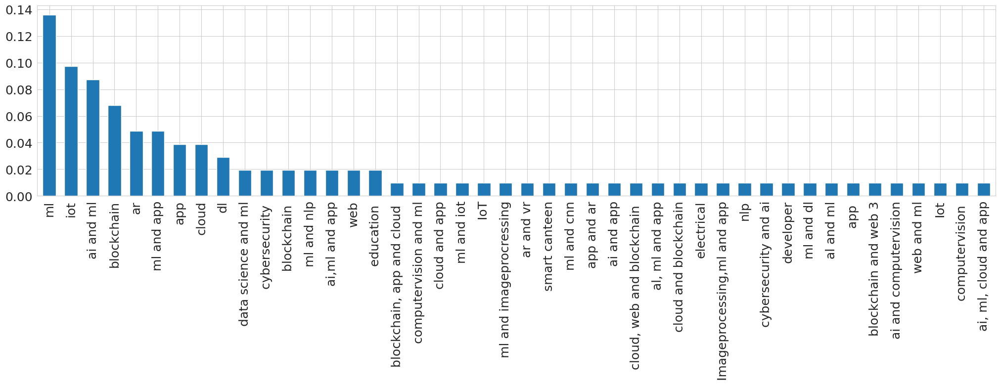

In [397]:
print("Unique values in the given column:",df['domain_of_edi_topic'].nunique())
print('Domains:\n',df.domain_of_edi_topic.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.domain_of_edi_topic.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [398]:
df["edi_topic"].value_counts()

smart campus                                                                3
physio at home                                                              2
telegram bot for image steganography                                        2
smart canteen                                                               2
automated irrigation system using iot                                       2
                                                                           ..
block chain in supply chain                                                 1
door lock system                                                            1
exist mental health app                                                     1
parkinson disease prediction through handwriting using machine learning.    1
diabetic retinopathy detection                                              1
Name: edi_topic, Length: 95, dtype: int64

Unique values in the given column: 95
EDI Topics
 smart campus                                                                0.029126
physio at home                                                              0.019417
telegram bot for image steganography                                        0.019417
smart canteen                                                               0.019417
automated irrigation system using iot                                       0.019417
                                                                              ...   
block chain in supply chain                                                 0.009709
door lock system                                                            0.009709
exist mental health app                                                     0.009709
parkinson disease prediction through handwriting using machine learning.    0.009709
diabetic retinopathy detection                                              0.009709
Name: edi_topic

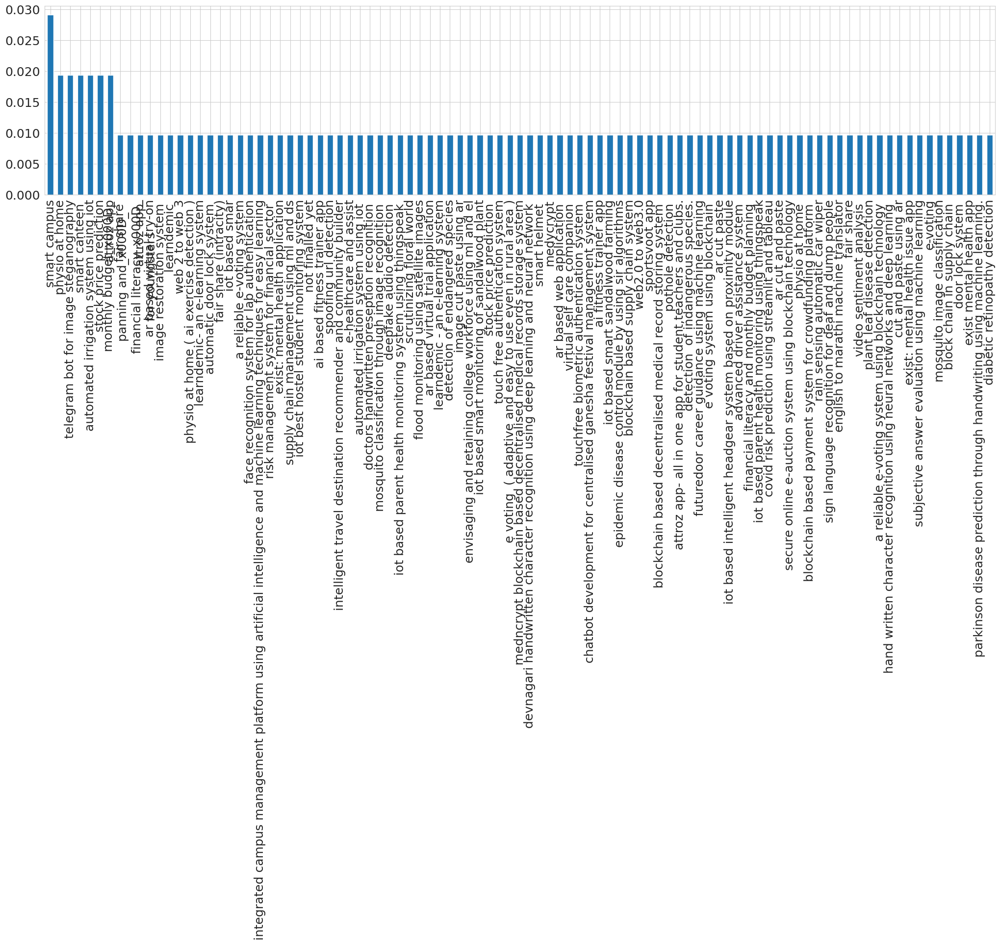

In [399]:
print("Unique values in the given column:",df['edi_topic'].nunique())
print('EDI Topics\n',df.edi_topic.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.edi_topic.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [400]:
df["paid_unpaid_head"].value_counts()

yes              60
unpiad_member    26
no               17
Name: paid_unpaid_head, dtype: int64

Unique values in the given column: 3
paidunpaid|head:
 yes              0.582524
unpiad_member    0.252427
no               0.165049
Name: paid_unpaid_head, dtype: float64


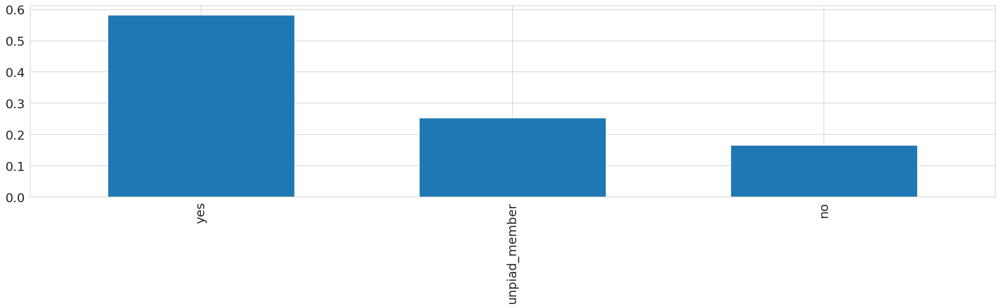

In [401]:
print("Unique values in the given column:",df['paid_unpaid_head'].nunique())
#df = df.rename(columns={'paid|unpaid|head': 'paid_unpaid_head'})
print('paidunpaid|head:\n',df.paid_unpaid_head.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.paid_unpaid_head.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [402]:
df["Name_of_the_club_chapter"] = df["Name_of_the_club_chapter"].replace("rotract", "rotaract")


In [403]:
df["Name_of_the_club_chapter"].value_counts()

na                                    16
yin                                   13
rotaract                              12
coding                                 8
e-cell                                 5
iei                                    4
cipher                                 4
acm                                    4
ieee                                   3
gdsc                                   3
yin, cyberbort                         2
cyberbort                              2
ire                                    1
rotaract, e-cell                       1
acm, cipher, rotract, tpc              1
ieee, nss, yin                         1
gdsc, acm                              1
tedx                                   1
shaashwat                              1
art, coding                            1
acm, coding, aces                      1
e-cell, coding, rotaract               1
e-cell, cipher, sp&ir, aces, gdsc      1
ieee, yin                              1
e-cell, aic     

In [404]:
df['Name_of_the_club_chapter'] = df['Name_of_the_club_chapter'].replace('na', np.nan)

# Convert to integer
df['Name_of_the_club_chapter'] = df['Name_of_the_club_chapter'].astype(str)

# Print the result
df["Name_of_the_club_chapter"].value_counts()

nan                                   16
yin                                   13
rotaract                              12
coding                                 8
e-cell                                 5
iei                                    4
cipher                                 4
acm                                    4
ieee                                   3
gdsc                                   3
yin, cyberbort                         2
cyberbort                              2
ire                                    1
rotaract, e-cell                       1
acm, cipher, rotract, tpc              1
ieee, nss, yin                         1
gdsc, acm                              1
tedx                                   1
shaashwat                              1
art, coding                            1
acm, coding, aces                      1
e-cell, coding, rotaract               1
e-cell, cipher, sp&ir, aces, gdsc      1
ieee, yin                              1
e-cell, aic     

Unique values in the given column: 39
Name of club_chapter
 nan                                   0.155340
yin                                   0.126214
rotaract                              0.116505
coding                                0.077670
e-cell                                0.048544
iei                                   0.038835
cipher                                0.038835
acm                                   0.038835
ieee                                  0.029126
gdsc                                  0.029126
yin, cyberbort                        0.019417
cyberbort                             0.019417
ire                                   0.009709
rotaract, e-cell                      0.009709
acm, cipher, rotract, tpc             0.009709
ieee, nss, yin                        0.009709
gdsc, acm                             0.009709
tedx                                  0.009709
shaashwat                             0.009709
art, coding                           0.009709


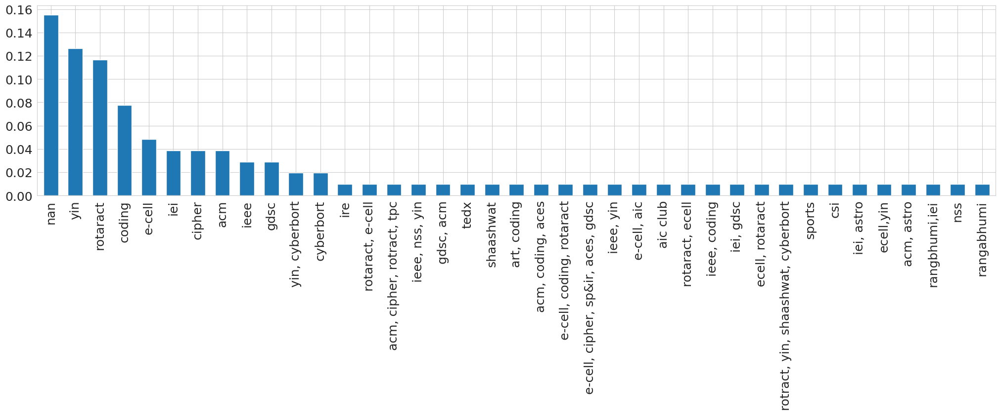

In [405]:
print("Unique values in the given column:",df['Name_of_the_club_chapter'].nunique())
#df = df.rename(columns={'Name_of_the_club|chapter': 'Name_of_the_club_chapter'})
print('Name of club_chapter\n',df.Name_of_the_club_chapter.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.Name_of_the_club_chapter.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [406]:
df["clubs_joined"].value_counts()

1    67
2    15
0    14
3     5
4     1
5     1
Name: clubs_joined, dtype: int64

Unique values in the given column: 6
Number of club joined: 
 1    0.650485
2    0.145631
0    0.135922
3    0.048544
4    0.009709
5    0.009709
Name: clubs_joined, dtype: float64


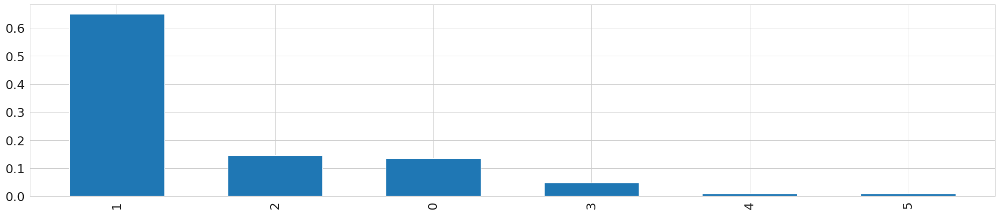

In [407]:
print("Unique values in the given column:",df['clubs_joined'].nunique())
print('Number of club joined: \n',df.clubs_joined.value_counts(normalize=True))
plt.figure(figsize=(25, 5))
df.clubs_joined.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [408]:
df["avg_time_on_social_media"].value_counts()

2.00     30
1.00     24
3.00     18
0.50      9
4.00      6
5.00      5
7.00      2
1.50      2
2.50      1
0.25      1
0.80      1
0.67      1
10.00     1
Name: avg_time_on_social_media, dtype: int64

Unique values in the given column: 13
Average time spent on social media
 2.00     0.297030
1.00     0.237624
3.00     0.178218
0.50     0.089109
4.00     0.059406
5.00     0.049505
7.00     0.019802
1.50     0.019802
2.50     0.009901
0.25     0.009901
0.80     0.009901
0.67     0.009901
10.00    0.009901
Name: avg_time_on_social_media, dtype: float64


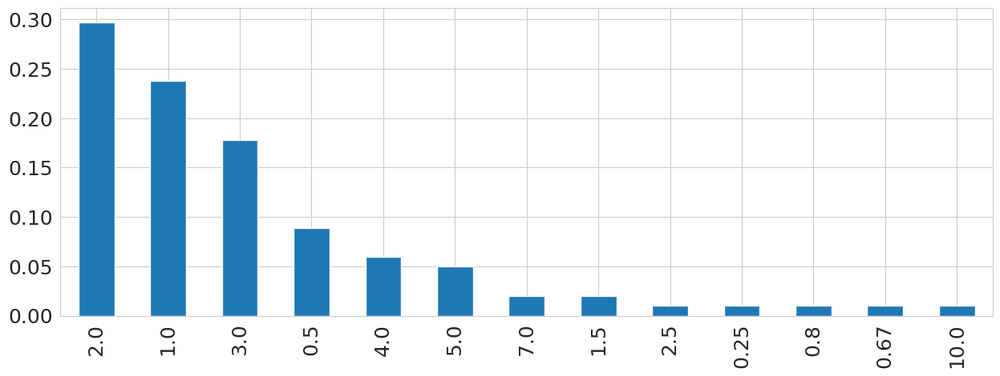

In [409]:
print("Unique values in the given column:",df['avg_time_on_social_media'].nunique())
print('Average time spent on social media\n',df.avg_time_on_social_media.value_counts(normalize=True))
plt.figure(figsize=(15, 5))
df.avg_time_on_social_media.value_counts(normalize=True).plot(kind='bar', width=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [410]:
df["social_media"].value_counts()

youtube      45
instagram    40
linkedin     12
whatsapp      5
facebook      1
Name: social_media, dtype: int64

Unique values in the given column: 5
Social Media:
 youtube      0.436893
instagram    0.388350
linkedin     0.116505
whatsapp     0.048544
facebook     0.009709
Name: social_media, dtype: float64


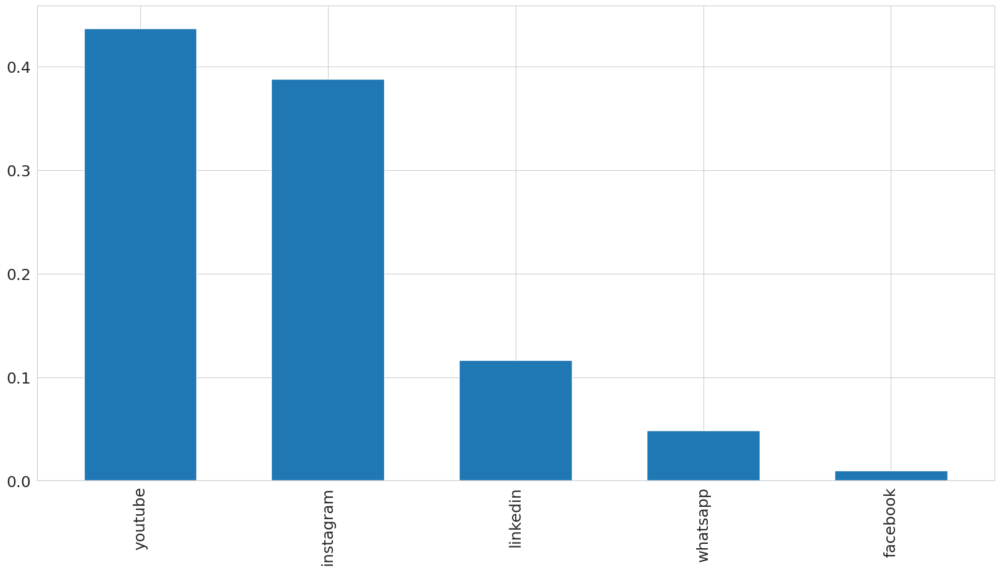

In [411]:
print("Unique values in the given column:",df['social_media'].nunique())
print('Social Media:\n',df.social_media.value_counts(normalize=True))
plt.figure(figsize=(20, 10))
df.social_media.value_counts(normalize=True).plot(kind='bar', width=0.6)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()


In [412]:
df["hobbies"].value_counts()

cricket                                                                8
reading                                                                8
games                                                                  8
music                                                                  7
arts                                                                   6
traveling                                                              4
dancing                                                                4
learning                                                               3
writing                                                                2
singing                                                                2
trekking                                                               2
youtube                                                                2
travelling                                                             2
bike riding                                        

Unique values in the given column: 54
Hobbies
 cricket                                                                0.077670
reading                                                                0.077670
games                                                                  0.077670
music                                                                  0.067961
arts                                                                   0.058252
traveling                                                              0.038835
dancing                                                                0.038835
learning                                                               0.029126
writing                                                                0.019417
singing                                                                0.019417
trekking                                                               0.019417
youtube                                                                0.

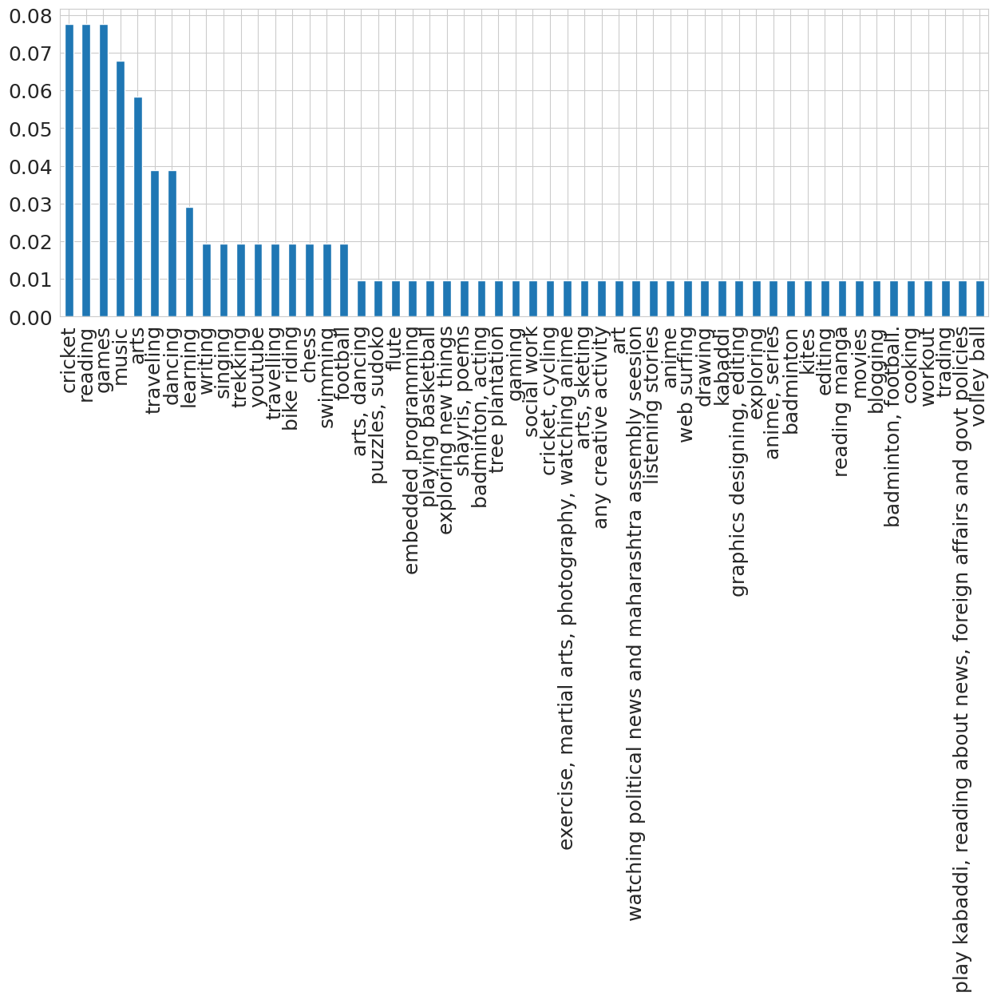

In [413]:
print("Unique values in the given column:",df['hobbies'].nunique())
print('Hobbies\n',df.hobbies.value_counts(normalize=True))
plt.figure(figsize=(15, 5))
df.hobbies.value_counts(normalize=True).plot(kind='bar', width=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [414]:
df["how_you_spend_free_time"].value_counts()

games                         10
music                          6
reading                        6
movies                         6
sleep                          2
                              ..
exercise                       1
trying to know myself more     1
anime                          1
flute, piano                   1
web apps                       1
Name: how_you_spend_free_time, Length: 69, dtype: int64

Unique values in the given column: 69
Spend free time:
 games                         0.098039
music                         0.058824
reading                       0.058824
movies                        0.058824
sleep                         0.019608
                                ...   
exercise                      0.009804
trying to know myself more    0.009804
anime                         0.009804
flute, piano                  0.009804
web apps                      0.009804
Name: how_you_spend_free_time, Length: 69, dtype: float64


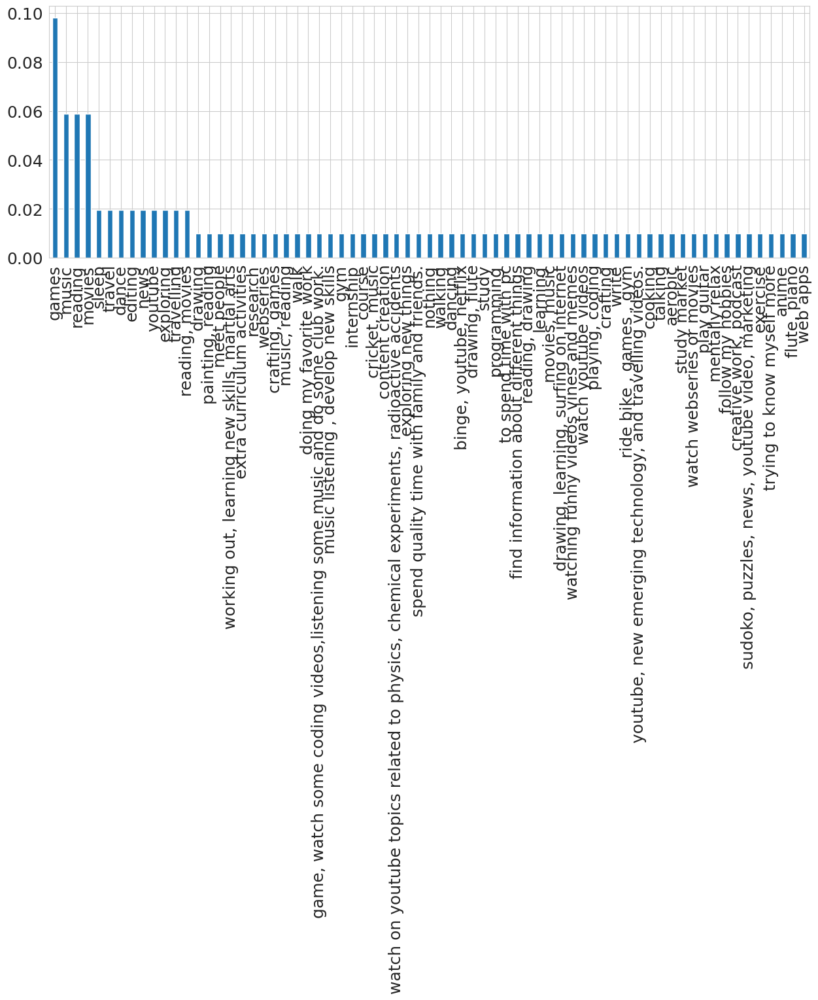

In [415]:
print("Unique values in the given column:",df['how_you_spend_free_time'].nunique())
print('Spend free time:\n',df.how_you_spend_free_time.value_counts(normalize=True))
plt.figure(figsize=(15, 5))
df.how_you_spend_free_time.value_counts(normalize=True).plot(kind='bar', width=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [416]:
df["fees"].value_counts()

112190.0    27
63495.0     18
190.0        9
64305.0      6
61963.0      6
14799.0      5
112000.0     4
63405.0      3
24190.0      2
15000.0      2
113000.0     2
64395.0      2
63000.0      2
113190.0     1
115000.0     1
64495.0      1
112160.0     1
1000.0       1
63450.0      1
200000.0     1
112900.0     1
61936.0      1
116000.0     1
61990.0      1
14609.0      1
112290.0     1
63350.0      1
Name: fees, dtype: int64

Unique values in the given column: 27
Fees: 
 112190.0    0.264706
63495.0     0.176471
190.0       0.088235
64305.0     0.058824
61963.0     0.058824
14799.0     0.049020
112000.0    0.039216
63405.0     0.029412
24190.0     0.019608
15000.0     0.019608
113000.0    0.019608
64395.0     0.019608
63000.0     0.019608
113190.0    0.009804
115000.0    0.009804
64495.0     0.009804
112160.0    0.009804
1000.0      0.009804
63450.0     0.009804
200000.0    0.009804
112900.0    0.009804
61936.0     0.009804
116000.0    0.009804
61990.0     0.009804
14609.0     0.009804
112290.0    0.009804
63350.0     0.009804
Name: fees, dtype: float64


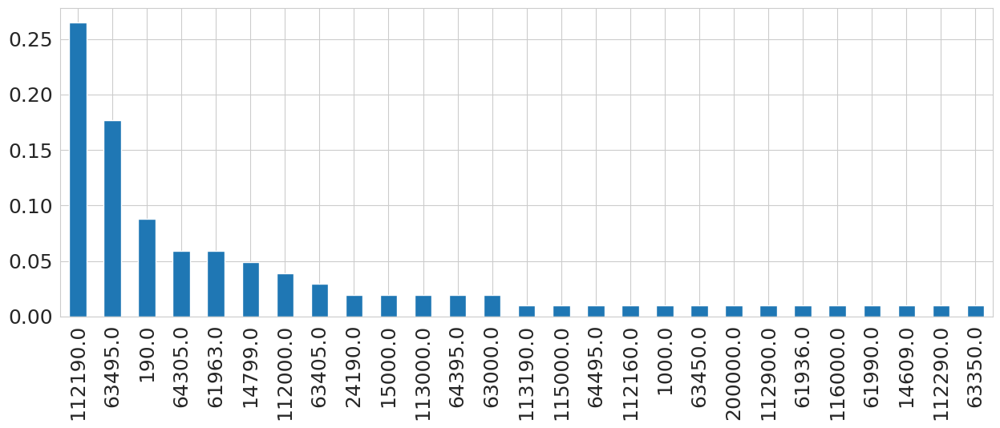

In [417]:
print("Unique values in the given column:",df['fees'].nunique())
print('Fees: \n',df.fees.value_counts(normalize=True))
plt.figure(figsize=(15, 5))
df.fees.value_counts(normalize=True).plot(kind='bar', width=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [418]:
df.isna().sum()

Timestamp                    0
email_address                0
full_name                    0
prn_number                   0
roll_number                  0
age                          0
gender                       0
current_address              0
permanent_address            0
department                   0
year                         0
division                     0
cgpa                         0
sgpa                         0
percentage_10th              0
percentage_12th             10
diploma_percentage          95
certification                0
certification_platform       0
domain_of_edi_topic          0
edi_topic                    0
paid_unpaid_head             0
Name_of_the_club_chapter     0
clubs_joined                 0
avg_time_on_social_media     2
social_media                 0
hobbies                      0
how_you_spend_free_time      1
fees                         1
dtype: int64

In [419]:
import nltk
from nltk.tokenize import word_tokenize

In [420]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [421]:
edi_topics = df.edi_topic.str.cat(sep=' ')
#function to split text into word
edi_topic_tokens = word_tokenize(edi_topics)
edi_topic_vocabulary = set(edi_topic_tokens)
print(len(edi_topic_vocabulary))
edi_topic_frequency_dist = nltk.FreqDist(edi_topic_tokens)
sorted(edi_topic_frequency_dist,key=edi_topic_frequency_dist.__getitem__, reverse=True)[0:50]

234


['system',
 'using',
 'and',
 'based',
 'iot',
 'for',
 'app',
 'detection',
 'smart',
 'ar',
 'blockchain',
 'learning',
 'image',
 'recognition',
 'machine',
 'health',
 'monitoring',
 'prediction',
 'physio',
 'at',
 'home',
 'cut',
 'paste',
 'attroz',
 'to',
 'campus',
 'chain',
 'management',
 'financial',
 'of',
 '.',
 'in',
 'supply',
 'disease',
 'ai',
 'authentication',
 'virtual',
 'web',
 'application',
 'exist',
 'mental',
 'e-voting',
 'stock',
 'price',
 'fair',
 'share',
 '(',
 ')',
 'automated',
 'irrigation']

In [422]:
  import nltk
  nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [423]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
edi_topic_tokens = [w for w in edi_topic_tokens if not w in stop_words]

edi_topic_frequency_dist = nltk.FreqDist(edi_topic_tokens)
edi_topic_tokens = list(filter(lambda edi_topic_token: edi_topic_token not in string.punctuation, edi_topic_tokens))
edi_topic_vocabulary = set(edi_topic_tokens)
print(len(edi_topic_vocabulary))
edi_topic_tokens=[edi_topic_tokens for word in edi_topic_tokens if word.isalpha()]
sorted(edi_topic_frequency_dist,key=edi_topic_frequency_dist.__getitem__, reverse=True)[0:50]

215


['system',
 'using',
 'based',
 'iot',
 'app',
 'detection',
 'smart',
 'ar',
 'blockchain',
 'learning',
 'image',
 'recognition',
 'machine',
 'health',
 'monitoring',
 'prediction',
 'physio',
 'home',
 'cut',
 'paste',
 'attroz',
 'campus',
 'chain',
 'management',
 'financial',
 '.',
 'supply',
 'disease',
 'ai',
 'authentication',
 'virtual',
 'web',
 'application',
 'exist',
 'mental',
 'e-voting',
 'stock',
 'price',
 'fair',
 'share',
 '(',
 ')',
 'automated',
 'irrigation',
 'monthly',
 'intelligent',
 'module',
 'e',
 'voting',
 'species']

In [424]:
remove_tokens = ['(', ')', '[', ']', '{', '}','using','yet']  # define the list of bracket tokens to remove

edi_topic_tokens = [edi_topic_token for edi_topic_token in edi_topic_tokens if edi_topic_token not in remove_tokens]  # remove bracket tokens from the list

print(edi_topic_tokens)

[['finalled', 'yet', 'physio', 'home', 'financial', 'literacy', 'monthly', 'budget', 'planning', 'advanced', 'driver', 'assistance', 'system', 'iot', 'based', 'intelligent', 'headgear', 'system', 'based', 'proximity', 'module', 'ar', 'cut', 'paste', 'e', 'voting', 'system', 'using', 'blockchain', 'futuredoor', 'career', 'guidance', 'using', 'machine', 'learning', 'detection', 'indangerous', 'species', 'attroz', 'app-', 'one', 'app', 'student', 'teachers', 'clubs', 'pothole', 'detection', 'telegram', 'bot', 'image', 'steganography', 'blockchain', 'based', 'decentralised', 'medical', 'record', 'storing', 'system', 'sportsvoot', 'app', 'web2.0', 'web3.0', 'smart', 'campus', 'smart', 'campus', 'blockchain', 'based', 'supply', 'chain', 'system', 'epidemic', 'disease', 'control', 'module', 'using', 'sir', 'algorithms', 'iot', 'based', 'smart', 'sandalwood', 'farming', 'ai', 'fitness', 'trainer', 'app', 'chatbot', 'development', 'centralised', 'ganesha', 'festival', 'management', 'system', 't

In [425]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['using', 'yet','system'])

edi_topic_tokens = [word.lower() for sublist in edi_topic_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

edi_topic_tokens = [edi_topic_token for edi_topic_token in edi_topic_tokens if (edi_topic_token not in stop_words and edi_topic_token not in string.punctuation)]

print(edi_topic_tokens)

#sorted(frequency_dist,key=frequency_dist.__getitem__, reverse=True)[0:50]


['finalled', 'physio', 'home', 'financial', 'literacy', 'monthly', 'budget', 'planning', 'advanced', 'driver', 'assistance', 'iot', 'based', 'intelligent', 'headgear', 'based', 'proximity', 'module', 'ar', 'cut', 'paste', 'e', 'voting', 'blockchain', 'futuredoor', 'career', 'guidance', 'machine', 'learning', 'detection', 'indangerous', 'species', 'attroz', 'app-', 'one', 'app', 'student', 'teachers', 'clubs', 'pothole', 'detection', 'telegram', 'bot', 'image', 'steganography', 'blockchain', 'based', 'decentralised', 'medical', 'record', 'storing', 'sportsvoot', 'app', 'web2.0', 'web3.0', 'smart', 'campus', 'smart', 'campus', 'blockchain', 'based', 'supply', 'chain', 'epidemic', 'disease', 'control', 'module', 'sir', 'algorithms', 'iot', 'based', 'smart', 'sandalwood', 'farming', 'ai', 'fitness', 'trainer', 'app', 'chatbot', 'development', 'centralised', 'ganesha', 'festival', 'management', 'touchfree', 'biometric', 'authentication', 'virtual', 'self', 'care', 'companion', 'iot', 'based

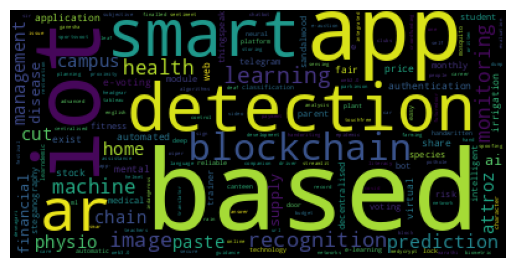

In [426]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
edi_topic_frequency_dist = nltk.FreqDist(edi_topic_tokens)
wordcloud = WordCloud().generate_from_frequencies(edi_topic_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [427]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normailzed_edi_topic_tokens=edi_topic_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normailzed_edi_topic_tokens)

# transform the tokenized data into a numerical matrix
X1 = vectorizer.transform(normailzed_edi_topic_tokens)

# view the matrix as a dense array
print(X1.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [428]:
certifications = df.certification.str.cat(sep=' ')
#function to split text into word
certification_tokens = word_tokenize(certifications)
certification_vocabulary = set(certification_tokens)
print(len(certification_vocabulary))
certification_frequency_dist = nltk.FreqDist(certification_tokens)
sorted(certification_frequency_dist,key=certification_frequency_dist.__getitem__, reverse=True)[0:50]

50


['python',
 'web',
 'cloud',
 'development',
 'learning',
 'dsa',
 'machine',
 'java',
 'c++',
 'nan',
 'ict',
 'fundamentals',
 'ethical',
 'hacking',
 'networking',
 'computer',
 'html',
 'cybersecurity',
 'design',
 'udemy',
 'matlab',
 'iot',
 'deep',
 'go',
 'programming',
 'rpa',
 'uipath',
 'developer',
 'communication',
 'foundation',
 'dbms',
 'accelerated',
 'science',
 'c',
 'academy',
 'artificial',
 'intelligence',
 'bentley',
 'institute',
 'certification',
 ',',
 'curiousjr',
 'flutter',
 'comptia',
 'a+',
 'solidity',
 'alpha-',
 'apna',
 'college',
 'android']

In [429]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
certification_tokens = [w for w in certification_tokens if not w in stop_words]

certification_frequency_dist = nltk.FreqDist(certification_tokens)
certification_tokens = list(filter(lambda certification_token: certification_token not in string.punctuation, certification_tokens))
certification_vocabulary = set(certification_tokens)
print(len(certification_vocabulary))
certification_tokens=[certification_tokens for word in certification_tokens if word.isalpha()]
sorted(certification_frequency_dist,key=certification_frequency_dist.__getitem__, reverse=True)[0:50]

49


['python',
 'web',
 'cloud',
 'development',
 'learning',
 'dsa',
 'machine',
 'java',
 'c++',
 'nan',
 'ict',
 'fundamentals',
 'ethical',
 'hacking',
 'networking',
 'computer',
 'html',
 'cybersecurity',
 'design',
 'udemy',
 'matlab',
 'iot',
 'deep',
 'go',
 'programming',
 'rpa',
 'uipath',
 'developer',
 'communication',
 'foundation',
 'dbms',
 'accelerated',
 'science',
 'c',
 'academy',
 'artificial',
 'intelligence',
 'bentley',
 'institute',
 'certification',
 ',',
 'curiousjr',
 'flutter',
 'comptia',
 'a+',
 'solidity',
 'alpha-',
 'apna',
 'college',
 'android']

In [430]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['nan'])

certification_tokens = [word.lower() for sublist in certification_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

certification_tokens = [certification_token for certification_token in certification_tokens if (certification_token not in stop_words and certification_token not in string.punctuation)]

print(certification_tokens)

['c++', 'dsa', 'udemy', 'machine', 'learning', 'cloud', 'ethical', 'hacking', 'networking', 'matlab', 'web', 'development', 'python', 'java', 'c++', 'machine', 'learning', 'ict', 'cloud', 'web', 'development', 'python', 'cloud', 'java', 'iot', 'deep', 'learning', 'dsa', 'cloud', 'go', 'programming', 'ethical', 'hacking', 'python', 'python', 'rpa', 'uipath', 'developer', 'machine', 'learning', 'python', 'communication', 'foundation', 'python', 'python', 'python', 'dbms', 'java', 'accelerated', 'computer', 'science', 'fundamentals', 'machine', 'learning', 'java', 'python', 'html', 'machine', 'learning', 'c', 'web', 'development', 'cloud', 'dsa', 'web', 'development', 'ict', 'academy', 'python', 'dsa', 'artificial', 'intelligence', 'python', 'bentley', 'institute', 'certification', 'cybersecurity', 'web', 'development', 'python', 'curiousjr', 'html', 'flutter', 'ict', 'web', 'development', 'c++', 'c++', 'comptia', 'a+', 'java', 'solidity', 'ict', 'web', 'design', 'dsa', 'networking', 'jav

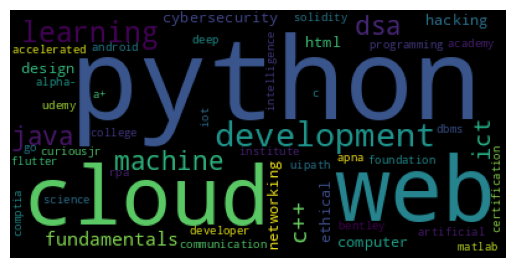

In [431]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
certification_frequency_dist = nltk.FreqDist(certification_tokens)
wordcloud = WordCloud().generate_from_frequencies(certification_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


In [432]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normailzed_certification_tokens=certification_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normailzed_certification_tokens)

# transform the tokenized data into a numerical matrix
X2 = vectorizer.transform(normailzed_certification_tokens)

# view the matrix as a dense array
print(X2.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [433]:
certification_platforms = df.certification_platform.str.cat(sep=' ')
#function to split text into word
certification_platforms_tokens = word_tokenize(certification_platforms)
certification_platforms_vocabulary = set(certification_platforms_tokens)
print(len(certification_platforms_vocabulary))
certification_platforms_frequency_dist = nltk.FreqDist(certification_platforms_tokens)
sorted(certification_platforms_frequency_dist,key=certification_platforms_frequency_dist.__getitem__, reverse=True)[0:50]

7


['udemy', 'other', 'coursera', 'linkedin', 'learning', 'coding', 'ninja']

In [434]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
certification_platforms_tokens = [w for w in certification_platforms_tokens if not w in stop_words]

certification_platforms_frequency_dist = nltk.FreqDist(certification_platforms_tokens)
certification_platforms_tokens = list(filter(lambda certification_platforms_token: certification_platforms_token not in string.punctuation, certification_platforms_tokens))
certification_platforms_vocabulary = set(certification_platforms_tokens)
print(len(certification_platforms_vocabulary))
certification_platforms_tokens=[certification_platforms_tokens for word in certification_platforms_tokens if word.isalpha()]
sorted(certification_platforms_frequency_dist,key=certification_platforms_frequency_dist.__getitem__, reverse=True)[0:50]

6


['udemy', 'coursera', 'linkedin', 'learning', 'coding', 'ninja']

In [435]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['nan'])

certification_platforms_tokens = [word.lower() for sublist in certification_platforms_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

certification_platforms_tokens = [certification_platforms_token for certification_platforms_token in certification_platforms_tokens if (certification_platforms_token not in stop_words and certification_platforms_token not in string.punctuation)]

print(certification_platforms_tokens)

['udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'udemy', 'udemy', 'coding', 'ninja', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'linkedin', 'learning', 'linkedin', 'learning', 'udemy', 'udemy', 'coursera', 'udemy', 'coursera', 'coursera', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'linkedin', 'learning', 'udemy', 'coursera', 'udemy', 'coursera', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'coursera', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'linkedin', 'learning', 'udemy', 'udemy', 'udemy', 'linkedin', 'learning', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'linkedin', 'learning', 'udemy', 'coding', 'ninja', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'coursera', 'udemy', 'udemy', 'linkedin', 'learning', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'udemy', 'coursera', 'udemy', 'udemy', 'ude

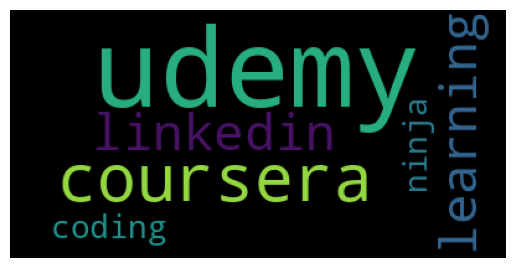

In [436]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
certification_platforms_frequency_dist = nltk.FreqDist(certification_platforms_tokens)
wordcloud = WordCloud().generate_from_frequencies(certification_platforms_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [437]:
domain_of_edi_topics = df.domain_of_edi_topic.str.cat(sep=' ')
#function to split text into word
domain_of_edi_topics_tokens = word_tokenize(domain_of_edi_topics)
domain_of_edi_topics_vocabulary = set(domain_of_edi_topics_tokens)
print(len(domain_of_edi_topics_vocabulary))
domain_of_edi_topics_frequency_dist = nltk.FreqDist(domain_of_edi_topics_tokens)
sorted(domain_of_edi_topics_frequency_dist,key=domain_of_edi_topics_frequency_dist.__getitem__, reverse=True)[0:50]

29


['ml',
 'and',
 'app',
 'ai',
 'blockchain',
 'iot',
 'cloud',
 ',',
 'ar',
 'web',
 'dl',
 'computervision',
 'cybersecurity',
 'nlp',
 'al',
 'data',
 'science',
 'education',
 'Iot',
 '3',
 'developer',
 'Imageprocessing',
 'electrical',
 'smart',
 'canteen',
 'vr',
 'imageprocressing',
 'cnn',
 'IoT']

In [438]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
domain_of_edi_topics_tokens = [w for w in domain_of_edi_topics_tokens if not w in stop_words]

domain_of_edi_topics_frequency_dist = nltk.FreqDist(domain_of_edi_topics_tokens)
domain_of_edi_topics_tokens = list(filter(lambda domain_of_edi_topics_token: domain_of_edi_topics_token not in string.punctuation,domain_of_edi_topics_tokens))
domain_of_edi_topics_vocabulary = set(domain_of_edi_topics_tokens)
print(len(domain_of_edi_topics_vocabulary))
domain_of_edi_topics_tokens=[domain_of_edi_topics_tokens for word in domain_of_edi_topics_tokens if word.isalpha()]
sorted(domain_of_edi_topics_frequency_dist,key=domain_of_edi_topics_frequency_dist.__getitem__, reverse=True)[0:50]

27


['ml',
 'app',
 'ai',
 'blockchain',
 'iot',
 'cloud',
 ',',
 'ar',
 'web',
 'dl',
 'computervision',
 'cybersecurity',
 'nlp',
 'al',
 'data',
 'science',
 'education',
 'Iot',
 '3',
 'developer',
 'Imageprocessing',
 'electrical',
 'smart',
 'canteen',
 'vr',
 'imageprocressing',
 'cnn',
 'IoT']

In [439]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['3',])

domain_of_edi_topics_tokens = [word.lower() for sublist in domain_of_edi_topics_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

domain_of_edi_topics_tokens = [domain_of_edi_topics_token for domain_of_edi_topics_token in domain_of_edi_topics_tokens if (domain_of_edi_topics_token not in stop_words and domain_of_edi_topics_token not in string.punctuation)]

print(domain_of_edi_topics_tokens)

['cloud', 'ai', 'ml', 'app', 'blockchain', 'computervision', 'iot', 'ar', 'blockchain', 'web', 'ml', 'ai', 'ml', 'ml', 'app', 'ai', 'computervision', 'cybersecurity', 'blockchain', 'web', 'app', 'blockchain', 'cloud', 'cloud', 'blockchain', 'ml', 'iot', 'al', 'ml', 'ml', 'nlp', 'cybersecurity', 'ai', 'ml', 'iot', 'ai', 'ml', 'ar', 'data', 'science', 'ml', 'web', 'ml', 'dl', 'ml', 'app', 'iot', 'developer', 'ml', 'cloud', 'blockchain', 'ml', 'nlp', 'app', 'cybersecurity', 'ai', 'ar', 'ml', 'dl', 'blockchain', 'dl', 'ml', 'app', 'nlp', 'imageprocessing', 'ml', 'app', 'electrical', 'blockchain', 'iot', 'app', 'ar', 'ai', 'ml', 'ml', 'al', 'ml', 'app', 'ml', 'computervision', 'ml', 'iot', 'iot', 'ai', 'ml', 'ai', 'ml', 'app', 'cloud', 'app', 'data', 'science', 'ml', 'ml', 'app', 'ml', 'iot', 'blockchain', 'blockchain', 'app', 'cloud', 'app', 'ai', 'ml', 'app', 'blockchain', 'cloud', 'education', 'smart', 'canteen', 'ar', 'ml', 'app', 'ml', 'ai', 'app', 'ml', 'ml', 'app', 'blockchain', 'clo

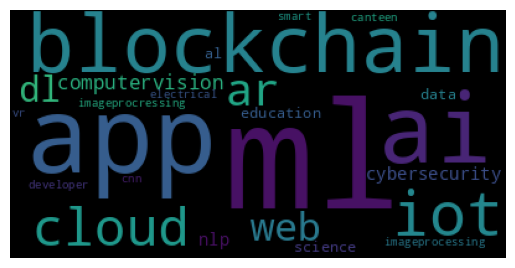

In [440]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
domain_of_edi_topics_frequency_dist = nltk.FreqDist(domain_of_edi_topics_tokens)
wordcloud = WordCloud().generate_from_frequencies(domain_of_edi_topics_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [441]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normalized_domain_of_edi_topics_tokens=domain_of_edi_topics_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normalized_domain_of_edi_topics_tokens)

# transform the tokenized data into a numerical matrix
X3 = vectorizer.transform(normalized_domain_of_edi_topics_tokens)

# view the matrix as a dense array
print(X3.toarray())

[[0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [442]:
Name_of_the_club_chapters = df.Name_of_the_club_chapter.str.cat(sep=' ')
#function to split text into word
Name_of_the_club_chapters_tokens = word_tokenize(Name_of_the_club_chapters)
Name_of_the_club_chapters_vocabulary = set(Name_of_the_club_chapters_tokens)
print(len(Name_of_the_club_chapters_vocabulary))
Name_of_the_club_chapters_frequency_dist = nltk.FreqDist(Name_of_the_club_chapters_tokens)
sorted(Name_of_the_club_chapters_frequency_dist,key=Name_of_the_club_chapters_frequency_dist.__getitem__, reverse=True)[0:50]

31


[',',
 'yin',
 'rotaract',
 'nan',
 'coding',
 'e-cell',
 'acm',
 'iei',
 'ieee',
 'cipher',
 'gdsc',
 'cyberbort',
 'ecell',
 'nss',
 'astro',
 'rotract',
 'shaashwat',
 'aic',
 'aces',
 'rangbhumi',
 'csi',
 'sports',
 'club',
 'ire',
 'tpc',
 'tedx',
 'art',
 'sp',
 '&',
 'ir',
 'rangabhumi']

In [443]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
Name_of_the_club_chapters_tokens = [w for w in Name_of_the_club_chapters_tokens if not w in stop_words]

Name_of_the_club_chapters_frequency_dist = nltk.FreqDist(Name_of_the_club_chapters_tokens)
Name_of_the_club_chapters_tokens = list(filter(lambda token: token not in string.punctuation, Name_of_the_club_chapters_tokens))
Name_of_the_club_chapters_vocabulary = set(Name_of_the_club_chapters_tokens)
print(len(Name_of_the_club_chapters_vocabulary))
Name_of_the_club_chapters_tokens=[Name_of_the_club_chapters_tokens for word in Name_of_the_club_chapters_tokens if word.isalpha()]
sorted(Name_of_the_club_chapters_frequency_dist,key=Name_of_the_club_chapters_frequency_dist.__getitem__, reverse=True)[0:50]

29


[',',
 'yin',
 'rotaract',
 'nan',
 'coding',
 'e-cell',
 'acm',
 'iei',
 'ieee',
 'cipher',
 'gdsc',
 'cyberbort',
 'ecell',
 'nss',
 'astro',
 'rotract',
 'shaashwat',
 'aic',
 'aces',
 'rangbhumi',
 'csi',
 'sports',
 'club',
 'ire',
 'tpc',
 'tedx',
 'art',
 'sp',
 '&',
 'ir',
 'rangabhumi']

In [444]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['club','&'])

Name_of_the_club_chapters_tokens = [word.lower() for sublist in Name_of_the_club_chapters_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

Name_of_the_club_chapters_tokens = [Name_of_the_club_chapters_token for Name_of_the_club_chapters_token in Name_of_the_club_chapters_tokens if (Name_of_the_club_chapters_token not in stop_words and Name_of_the_club_chapters_token not in string.punctuation)]

print(Name_of_the_club_chapters_tokens)

['ieee', 'nss', 'yin', 'rotaract', 'nss', 'rangbhumi', 'iei', 'acm', 'astro', 'rotaract', 'nan', 'nan', 'cipher', 'ecell', 'yin', 'rotaract', 'coding', 'acm', 'yin', 'rotaract', 'rotaract', 'rotaract', 'cipher', 'iei', 'astro', 'iei', 'yin', 'csi', 'iei', 'sports', 'nan', 'rotract', 'yin', 'shaashwat', 'cyberbort', 'acm', 'nan', 'e-cell', 'coding', 'ecell', 'rotaract', 'yin', 'iei', 'gdsc', 'nan', 'rotaract', 'aic', 'ieee', 'coding', 'coding', 'coding', 'yin', 'gdsc', 'nan', 'e-cell', 'ieee', 'cyberbort', 'rotaract', 'ecell', 'shaashwat', 'nan', 'yin', 'cipher', 'e-cell', 'e-cell', 'aic', 'rotaract', 'nan', 'ire', 'cipher', 'rotaract', 'e-cell', 'acm', 'cipher', 'rotract', 'tpc', 'rotaract', 'nan', 'yin', 'cyberbort', 'yin', 'cyberbort', 'gdsc', 'acm', 'rotaract', 'tedx', 'nan', 'cyberbort', 'coding', 'yin', 'gdsc', 'yin', 'art', 'coding', 'nan', 'nan', 'yin', 'acm', 'coding', 'aces', 'yin', 'yin', 'e-cell', 'coding', 'rotaract', 'nan', 'rotaract', 'e-cell', 'iei', 'yin', 'coding', 'na

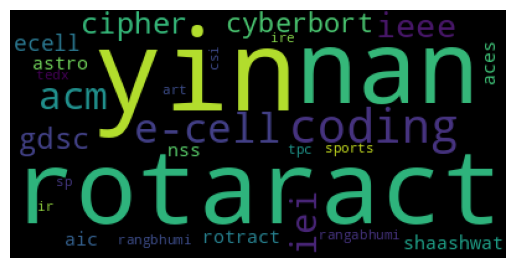

In [445]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
Name_of_the_club_chapters_frequency_dist = nltk.FreqDist(Name_of_the_club_chapters_tokens)
wordcloud = WordCloud().generate_from_frequencies(Name_of_the_club_chapters_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [446]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normalized_Name_of_the_club_chapters_tokens=Name_of_the_club_chapters_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normalized_Name_of_the_club_chapters_tokens)

# transform the tokenized data into a numerical matrix
X4 = vectorizer.transform(normalized_Name_of_the_club_chapters_tokens)

# view the matrix as a dense array
print(X4.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [447]:
hobbies_s = df.hobbies.str.cat(sep=' ')
#function to split text into word
hobbies_s_tokens = word_tokenize(hobbies_s)
hobbies_s_vocabulary = set(hobbies_s_tokens)
print(len(hobbies_s_vocabulary))
hobbies_s_frequency_dist = nltk.FreqDist(hobbies_s_tokens)
sorted(hobbies_s_frequency_dist,key=hobbies_s_frequency_dist.__getitem__, reverse=True)[0:50]

81


[',',
 'reading',
 'cricket',
 'arts',
 'games',
 'music',
 'dancing',
 'traveling',
 'learning',
 'football',
 'anime',
 'badminton',
 'writing',
 'swimming',
 'kabaddi',
 'editing',
 'exploring',
 'travelling',
 'youtube',
 'trekking',
 'singing',
 'news',
 'and',
 'chess',
 'watching',
 'bike',
 'riding',
 'workout',
 'drawing',
 'graphics',
 'designing',
 'series',
 'kites',
 'web',
 'surfing',
 'movies',
 'blogging',
 '.',
 'cooking',
 'listening',
 'stories',
 'trading',
 'play',
 'about',
 'foreign',
 'affairs',
 'govt',
 'policies',
 'manga',
 'any']

In [448]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
hobbies_s_tokens = [w for w in hobbies_s_tokens if not w in stop_words]

hobbies_s_frequency_dist = nltk.FreqDist(hobbies_s_tokens)
hobbies_s_tokens = list(filter(lambda hobbies_s_token: hobbies_s_token not in string.punctuation, hobbies_s_tokens))
hobbies_s_vocabulary = set(hobbies_s_tokens)
print(len(hobbies_s_vocabulary))
hobbies_s_tokens=[hobbies_s_tokens for word in hobbies_s_tokens if word.isalpha()]
sorted(hobbies_s_frequency_dist,key=hobbies_s_frequency_dist.__getitem__, reverse=True)[0:50]

76


[',',
 'reading',
 'cricket',
 'arts',
 'games',
 'music',
 'dancing',
 'traveling',
 'learning',
 'football',
 'anime',
 'badminton',
 'writing',
 'swimming',
 'kabaddi',
 'editing',
 'exploring',
 'travelling',
 'youtube',
 'trekking',
 'singing',
 'news',
 'chess',
 'watching',
 'bike',
 'riding',
 'workout',
 'drawing',
 'graphics',
 'designing',
 'series',
 'kites',
 'web',
 'surfing',
 'movies',
 'blogging',
 '.',
 'cooking',
 'listening',
 'stories',
 'trading',
 'play',
 'foreign',
 'affairs',
 'govt',
 'policies',
 'manga',
 'creative',
 'activity',
 'puzzles']

In [449]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['nan'])

hobbies_s_tokens = [word.lower() for sublist in hobbies_s_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

hobbies_s_tokens = [hobbies_s_token for hobbies_s_token in hobbies_s_tokens if (hobbies_s_token not in stop_words and hobbies_s_token not in string.punctuation)]

print(hobbies_s_tokens)

['writing', 'workout', 'learning', 'reading', 'drawing', 'music', 'traveling', 'swimming', 'kabaddi', 'graphics', 'designing', 'editing', 'football', 'writing', 'exploring', 'games', 'cricket', 'traveling', 'cricket', 'anime', 'series', 'badminton', 'cricket', 'kites', 'web', 'surfing', 'cricket', 'cricket', 'learning', 'editing', 'cricket', 'movies', 'learning', 'games', 'travelling', 'cricket', 'traveling', 'blogging', 'badminton', 'football', 'youtube', 'dancing', 'reading', 'swimming', 'games', 'trekking', 'cooking', 'listening', 'stories', 'singing', 'trading', 'play', 'kabaddi', 'reading', 'news', 'foreign', 'affairs', 'govt', 'policies', 'arts', 'reading', 'manga', 'chess', 'anime', 'creative', 'activity', 'puzzles', 'sudoko', 'games', 'music', 'traveling', 'embedded', 'programming', 'playing', 'basketball', 'arts', 'exploring', 'new', 'things', 'music', 'shayris', 'poems', 'cricket', 'gaming', 'social', 'work', 'exercise', 'martial', 'arts', 'photography', 'watching', 'anime', 

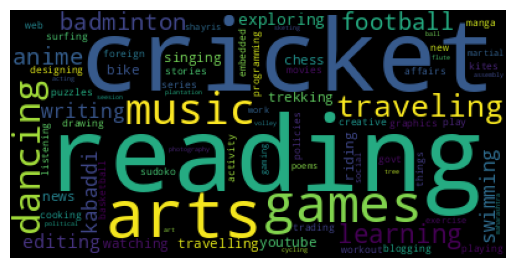

In [450]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
hobbies_s_frequency_dist = nltk.FreqDist(hobbies_s_tokens)
wordcloud = WordCloud().generate_from_frequencies(hobbies_s_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [451]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normalized_hobbies_s_tokens=hobbies_s_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normalized_hobbies_s_tokens)

# transform the tokenized data into a numerical matrix
X5 = vectorizer.transform(normalized_hobbies_s_tokens)

# view the matrix as a dense array
print(X5.toarray())

[[0 0 0 ... 0 1 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [452]:
how_you_spend_free_times = df.how_you_spend_free_time.str.cat(sep=' ')
#function to split text into word
how_you_spend_free_times_tokens = word_tokenize(how_you_spend_free_times)
how_you_spend_free_times_vocabulary = set(how_you_spend_free_times_tokens)
print(len(how_you_spend_free_times_vocabulary))
how_you_spend_free_times_frequency_dist = nltk.FreqDist(how_you_spend_free_times_tokens)
sorted(how_you_spend_free_times_frequency_dist,key=how_you_spend_free_times_frequency_dist.__getitem__, reverse=True)[0:50]

119


[',',
 'games',
 'reading',
 'music',
 'movies',
 'youtube',
 'drawing',
 'videos',
 'and',
 'watch',
 'new',
 'learning',
 'travelling',
 'exploring',
 'news',
 '.',
 'work',
 'to',
 'some',
 'sleep',
 'on',
 'editing',
 'coding',
 'crafting',
 'gym',
 'dance',
 'travel',
 'study',
 'webseries',
 'my',
 'flute',
 'things',
 'spend',
 'time',
 'with',
 'skills',
 'listening',
 'exercise',
 'surfing',
 'internet',
 'watching',
 'funny',
 'vines',
 'memes',
 'playing',
 'write',
 'ride',
 'bike',
 'emerging',
 'technology']

In [453]:
import string
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
how_you_spend_free_times_tokens = [w for w in how_you_spend_free_times_tokens if not w in stop_words]

how_you_spend_free_times_frequency_dist = nltk.FreqDist(how_you_spend_free_times_tokens)
how_you_spend_free_times_tokens = list(filter(lambda how_you_spend_free_times_token: how_you_spend_free_times_token not in string.punctuation, how_you_spend_free_times_tokens))
how_you_spend_free_times_vocabulary = set(how_you_spend_free_times_tokens)
print(len(how_you_spend_free_times_vocabulary))
how_you_spend_free_times_tokens=[how_you_spend_free_times_tokens for word in how_you_spend_free_times_tokens if word.isalpha()]
sorted(how_you_spend_free_times_frequency_dist,key=how_you_spend_free_times_frequency_dist.__getitem__, reverse=True)[0:50]

104


[',',
 'games',
 'reading',
 'music',
 'movies',
 'youtube',
 'drawing',
 'videos',
 'watch',
 'new',
 'learning',
 'travelling',
 'exploring',
 'news',
 '.',
 'work',
 'sleep',
 'editing',
 'coding',
 'crafting',
 'gym',
 'dance',
 'travel',
 'study',
 'webseries',
 'flute',
 'things',
 'spend',
 'time',
 'skills',
 'listening',
 'exercise',
 'surfing',
 'internet',
 'watching',
 'funny',
 'vines',
 'memes',
 'playing',
 'write',
 'ride',
 'bike',
 'emerging',
 'technology',
 'cooking',
 'talking',
 'aerobic',
 'market',
 'play',
 'guitar']

In [454]:
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.update(['nan','spend'])

how_you_spend_free_times_tokens = [word.lower() for sublist in how_you_spend_free_times_tokens for word in sublist]  # flatten the list of lists and convert to lowercase

how_you_spend_free_times_tokens = [how_you_spend_free_times_token for how_you_spend_free_times_token in how_you_spend_free_times_tokens if (how_you_spend_free_times_token not in stop_words and how_you_spend_free_times_token not in string.punctuation)]

print(how_you_spend_free_times_tokens)

['sleep', 'exercise', 'reading', 'reading', 'movies', 'reading', 'drawing', 'movies', 'learning', 'movies', 'music', 'games', 'drawing', 'learning', 'surfing', 'internet', 'travelling', 'music', 'games', 'games', 'games', 'exploring', 'music', 'exploring', 'movies', 'music', 'news', 'movies', 'watching', 'funny', 'videos', 'vines', 'memes', 'reading', 'editing', 'watch', 'youtube', 'videos', 'music', 'editing', 'playing', 'coding', 'crafting', 'games', 'games', 'write', 'ride', 'bike', 'games', 'gym', 'youtube', 'new', 'emerging', 'technology', 'travelling', 'videos', 'dance', 'reading', 'dance', 'travel', 'reading', 'cooking', 'talking', 'aerobic', 'study', 'market', 'watch', 'webseries', 'movies', 'music', 'play', 'guitar', 'mentally', 'relax', 'follow', 'hobbies', 'creative', 'work', 'podcast', 'sudoko', 'puzzles', 'news', 'youtube', 'video', 'marketing', 'games', 'news', 'travel', 'programming', 'trying', 'know', 'anime', 'flute', 'piano', 'find', 'information', 'different', 'thing

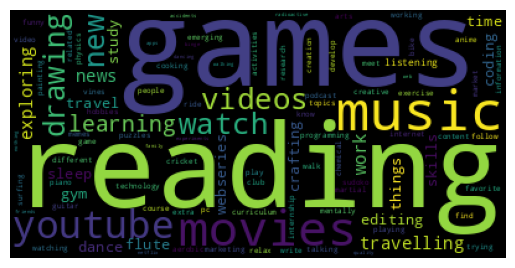

In [455]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
how_you_spend_free_times_frequency_dist = nltk.FreqDist(how_you_spend_free_times_tokens)
wordcloud = WordCloud().generate_from_frequencies(how_you_spend_free_times_frequency_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [456]:
from sklearn.feature_extraction.text import CountVectorizer

# example tokenized data
normalized_how_you_spend_free_times_tokens=how_you_spend_free_times_tokens

# create CountVectorizer object
vectorizer = CountVectorizer()

# fit the vectorizer to the data
vectorizer.fit(normalized_how_you_spend_free_times_tokens)

# transform the tokenized data into a numerical matrix
X6 = vectorizer.transform(normalized_how_you_spend_free_times_tokens)

# view the matrix as a dense array
print(X6.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [457]:
col_name = 'cgpa'

# Get the maximum value in the column
max_val = df[col_name].max()

# Calculate the number of decimal places needed
decimals = len(str(int(max_val)))

# Normalize the column using the decimal scaling method
df[col_name] = df[col_name] / (10 ** decimals)

# Print the normalized column
print(df[col_name])

0      0.810
1      0.890
2      0.957
3      0.874
4      0.900
       ...  
98     0.850
99     0.870
100    0.975
101    0.897
102    0.865
Name: cgpa, Length: 103, dtype: float64


In [458]:
col_name = 'sgpa'

# Get the maximum value in the column
max_val = df[col_name].max()

# Calculate the number of decimal places needed
decimals = len(str(int(max_val)))

# Normalize the column using the decimal scaling method
df[col_name] = df[col_name] / (10 ** 1)

# Print the normalized column
print(df[col_name])

0      0.810
1      0.904
2      0.959
3      0.840
4      0.900
       ...  
98     0.830
99     0.870
100    0.935
101    0.796
102    0.839
Name: sgpa, Length: 103, dtype: float64


In [459]:
col_name = 'percentage_10th'

# Get the maximum value in the column
max_val = df[col_name].max()

# Calculate the number of decimal places needed
decimals = len(str(int(max_val)))

# Normalize the column using the decimal scaling method
df[col_name] = df[col_name] / (10 ** decimals)

# Print the normalized column
print(df[col_name])

0      0.900
1      0.870
2      0.938
3      0.958
4      0.928
       ...  
98     0.932
99     0.890
100    0.924
101    0.932
102    0.906
Name: percentage_10th, Length: 103, dtype: float64


In [460]:
col_name = 'percentage_12th'

# Get the maximum value in the column
max_val = df[col_name].max()

# Calculate the number of decimal places needed
decimals = len(str(int(max_val)))

# Normalize the column using the decimal scaling method
df[col_name] = df[col_name] / (10 ** decimals)

# Print the normalized column
print(df[col_name])

0      0.8500
1      0.9000
2      0.9800
3      0.7492
4      0.9077
        ...  
98     0.7123
99     0.9400
100    0.8600
101    0.8215
102    0.7894
Name: percentage_12th, Length: 103, dtype: float64


In [461]:
col_name = 'diploma_percentage'

# Get the maximum value in the column
max_val = df[col_name].max()

# Calculate the number of decimal places needed
decimals = len(str(int(max_val)))

# Normalize the column using the decimal scaling method
df[col_name] = df[col_name] / (10 ** decimals)

# Print the normalized column
print(df[col_name])

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
98    NaN
99    NaN
100   NaN
101   NaN
102   NaN
Name: diploma_percentage, Length: 103, dtype: float64


In [462]:
df.to_csv('normalized_new.csv', index=False)

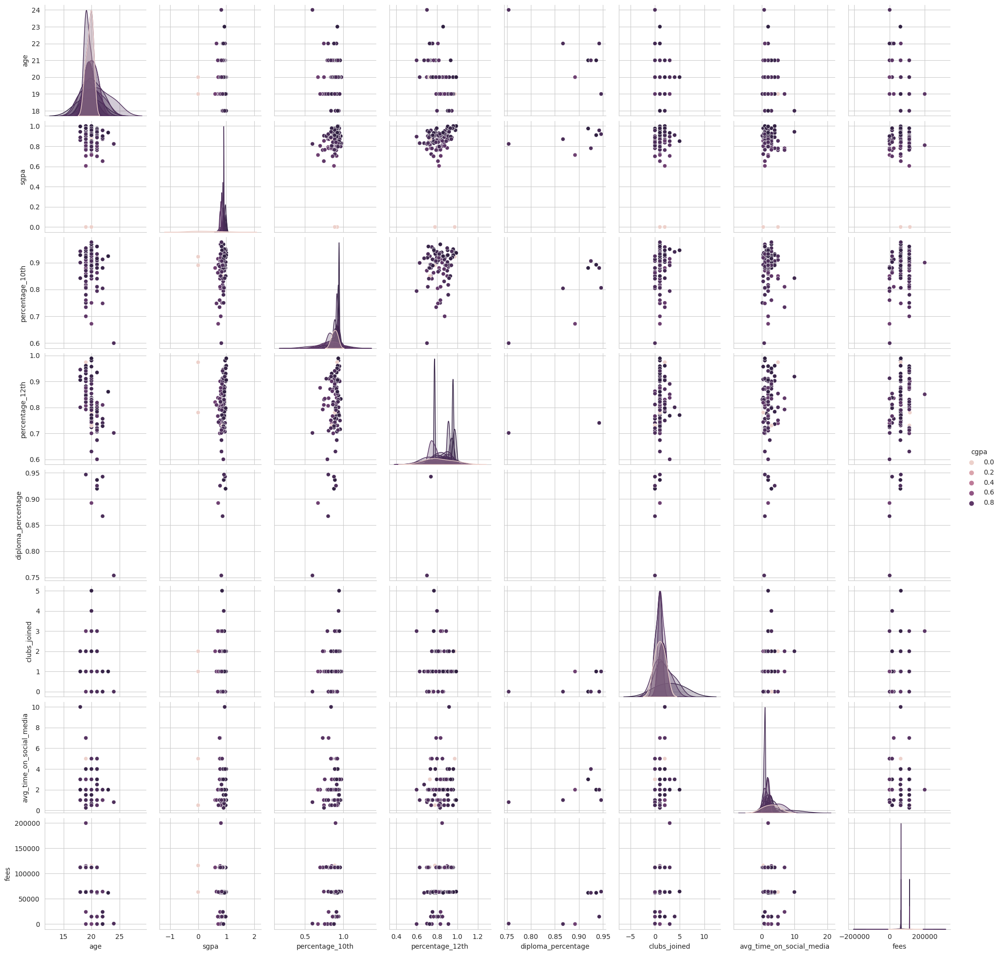

In [463]:
sns.pairplot(df,hue='cgpa')

In [464]:
# Get the minimum value of the "cpga" column
min_cpga = df['cgpa'].min()

# Get the maximum value of the "cpga" column
max_cpga = df['cgpa'].max()

# Get the average value of the "cpga" column
avg_cpga = df['cgpa'].mean()

# Print the results
print(f'Minimum CGPA: {min_cpga}')
print(f'Maximum CGPA: {max_cpga}')
print(f'Average CGPA: {avg_cpga}')
print("--------------------------------------------------------------------------------------------------------------------------------")
print("--------------------------------------------------------------------------------------------------------------------------------")

# Get the minimum value of the "sgpa" column
min_sgpa = df['sgpa'].min()

# Get the maximum value of the "sgpa" column
max_sgpa = df['sgpa'].max()

# Get the average value of the "sgpa" column
avg_sgpa = df['sgpa'].mean()

# Print the results
print(f'Minimum SGPA: {min_sgpa}')
print(f'Maximum SGPA: {max_sgpa}')
print(f'Average SGPA: {avg_sgpa}')
print("--------------------------------------------------------------------------------------------------------------------------------")
print("--------------------------------------------------------------------------------------------------------------------------------")

# Get the minimum value of the "percentage_10th" column
min_10th = df['percentage_10th'].min()

# Get the maximum value of the "percentage_10th" column
max_10th = df['percentage_10th'].max()

# Get the average value of the "percentage_10th" column
avg_10th = df['percentage_10th'].mean()

# Print the results
print(f'Minimum 10th Percentage: {min_10th}')
print(f'Maximum 10th Percentage: {max_10th}')
print(f'Average 10th Percentage: {avg_10th}')
print("--------------------------------------------------------------------------------------------------------------------------------")
print("--------------------------------------------------------------------------------------------------------------------------------")

# Get the minimum value of the "percentage_12th" column
min_12th = df['percentage_12th'].min()

# Get the maximum value of the "percentage_12th" column
max_12th = df['percentage_12th'].max()

# Get the average value of the "percentage_12th" column
avg_12th = df['percentage_12th'].mean()

# Print the results
print(f'Minimum 12th Percentage: {min_12th}')
print(f'Maximum 12th Percentage: {max_12th}')
print(f'Average 12th Percentage: {avg_12th}')
print("--------------------------------------------------------------------------------------------------------------------------------")
print("--------------------------------------------------------------------------------------------------------------------------------")

# Get the minimum value of the "diploma_percentage" column
min_diploma = df['diploma_percentage'].min()

# Get the maximum value of the "diploma_percentage" column
max_diploma = df['diploma_percentage'].max()

# Get the average value of the "diploma_percentage" column
avg_diploma = df['diploma_percentage'].mean()

# Print the results
print(f'Minimum Diploma Percentage: {min_diploma}')
print(f'Maximum Diploma Percentage: {max_diploma}')
print(f'Average Diploma Percentage: {avg_diploma}')
print("--------------------------------------------------------------------------------------------------------------------------------")
print("--------------------------------------------------------------------------------------------------------------------------------")
# Get the minimum value of the "fee" column
min_fee = df['fees'].min()

# Get the maximum value of the "percentage_12th" column
max_fee = df['fees'].max()

# Get the average value of the "percentage_12th" column
avg_fee = df['fees'].mean()

# Print the results
print(f'Minimum fee: {min_fee}')
print(f'Maximum fee: {max_fee}')
print(f'Average fee: {avg_fee}')


Minimum CGPA: 0.0
Maximum CGPA: 0.9869999999999999
Average CGPA: 0.8550097087378641
--------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------------------
Minimum SGPA: 0.0
Maximum SGPA: 1.0
Average SGPA: 0.850368932038835
--------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------------------------
Minimum 10th Percentage: 0.6
Maximum 10th Percentage: 0.976
Average 10th Percentage: 0.8827058252427185
--------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------

In [465]:
def replace_with_grade(nums):
    grades = []
    for num in nums:
        if num >= 0.600 and num <= 0.700:
            grades.append('c')
        elif num >0.700 and num <= 0.800:
            grades.append('b')
        elif num >=0.800 and num <= 0.900:
            grades.append('a')
        elif num > 0.900 and num <= 1.000:
            grades.append('s')
        else:
            grades.append('na')

    return grades

In [466]:
def replace_with_fee_range(nums):
    fees = []
    for num in nums:
        if num >= 0 and num <= 1000:
            fees.append('sc')
        elif num >= 1001 and num <= 20000:
            fees.append('st')
        elif num >= 60000 and num <= 80000:
            fees.append('open')
        elif num >= 90000 and num <= 250000:
            fees.append('full fees')
        else:
            fees.append('na')

    return fees

In [467]:
df['cgpa'] = df['cgpa'].apply(lambda x: round(x, 2))
df['sgpa'] = df['sgpa'].apply(lambda x: round(x, 2))
df['percentage_10th'] = df['percentage_10th'].apply(lambda x: round(x, 2))
df['percentage_12th'] = df['percentage_12th'].apply(lambda x: round(x, 2))
df['diploma_percentage'] = df['diploma_percentage'].apply(lambda x: round(x, 2))
#df['fees'] = df['fees'].apply(lambda x: round(x,))


In [468]:
df['cgpa'] = df['cgpa'].fillna(0)

In [469]:
# Pass the "cgpa" column to the replace_with_grade() function
df['cgpa'] = replace_with_grade(df['cgpa'])

# Print the updated "cgpa" column
print(df['cgpa'])

0      a
1      a
2      s
3      a
4      a
      ..
98     a
99     a
100    s
101    a
102    a
Name: cgpa, Length: 103, dtype: object


In [470]:
# Pass the "fees" column to the replace_with_fee_range() function
df['fees'] = replace_with_fee_range(df['fees'])

# Print the updated "cgpa" column
print(df['fees'])

0      full fees
1           open
2           open
3           open
4      full fees
         ...    
98     full fees
99     full fees
100         open
101    full fees
102         open
Name: fees, Length: 103, dtype: object


/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice



<Axes: xlabel='cgpa', ylabel='diploma_percentage'>

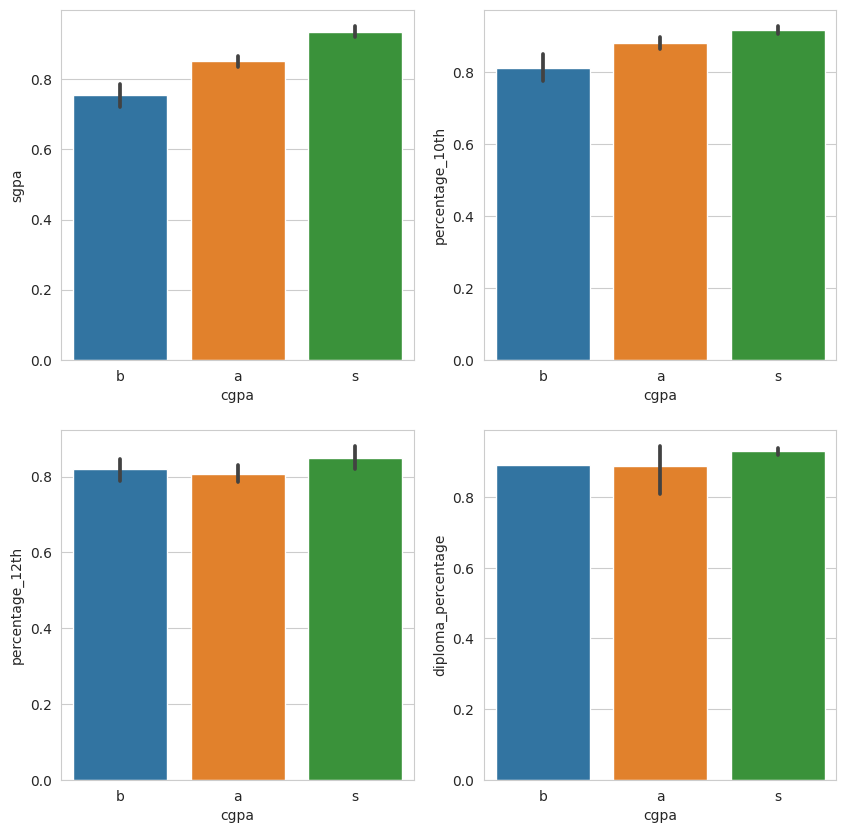

In [471]:
fig, axarr  = plt.subplots(2,2,figsize=(10,10))
sns.barplot(x='cgpa', y='sgpa', data=df, order=['b','a','s'], ax=axarr[0,0])
sns.barplot(x='cgpa', y='percentage_10th', data=df ,order=['b','a','s'], ax=axarr[0,1])
sns.barplot(x='cgpa', y='percentage_12th', data=df ,order=['b','a','s'], ax=axarr[1,0])
sns.barplot(x='cgpa', y='diploma_percentage', data=df,  order=['b','a','s'], ax=axarr[1,1])

<Axes: xlabel='year', ylabel='count'>

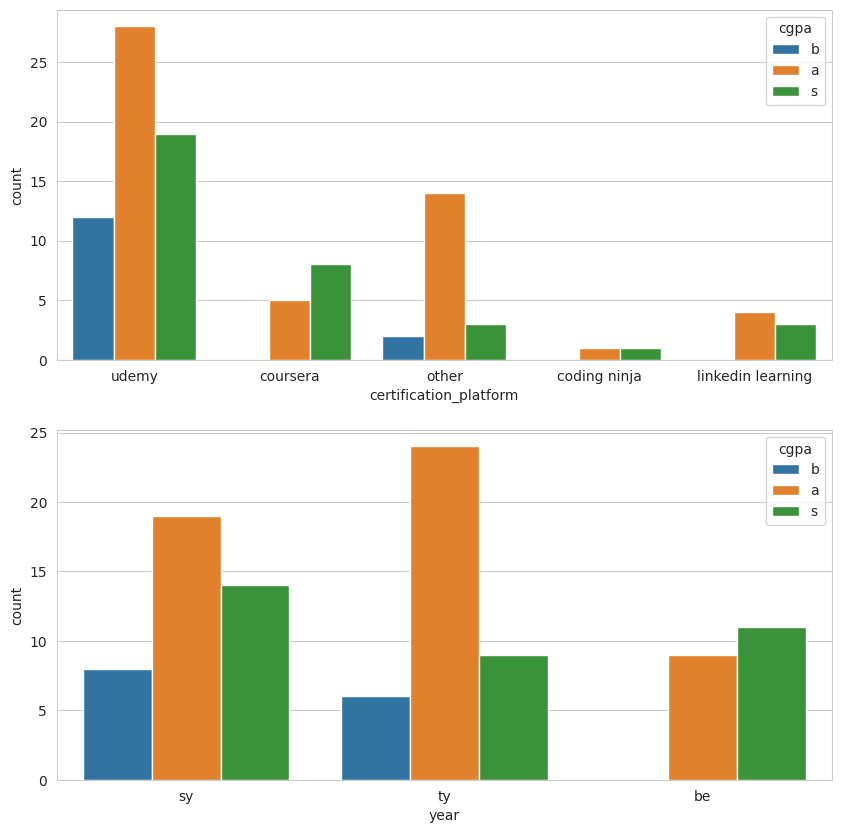

In [472]:
fig, (axis1, axis2)  = plt.subplots(2, 1,figsize=(10,10))

sns.countplot(x='certification_platform', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis1)
sns.countplot(x='year', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis2)

<Axes: xlabel='paid_unpaid_head', ylabel='count'>

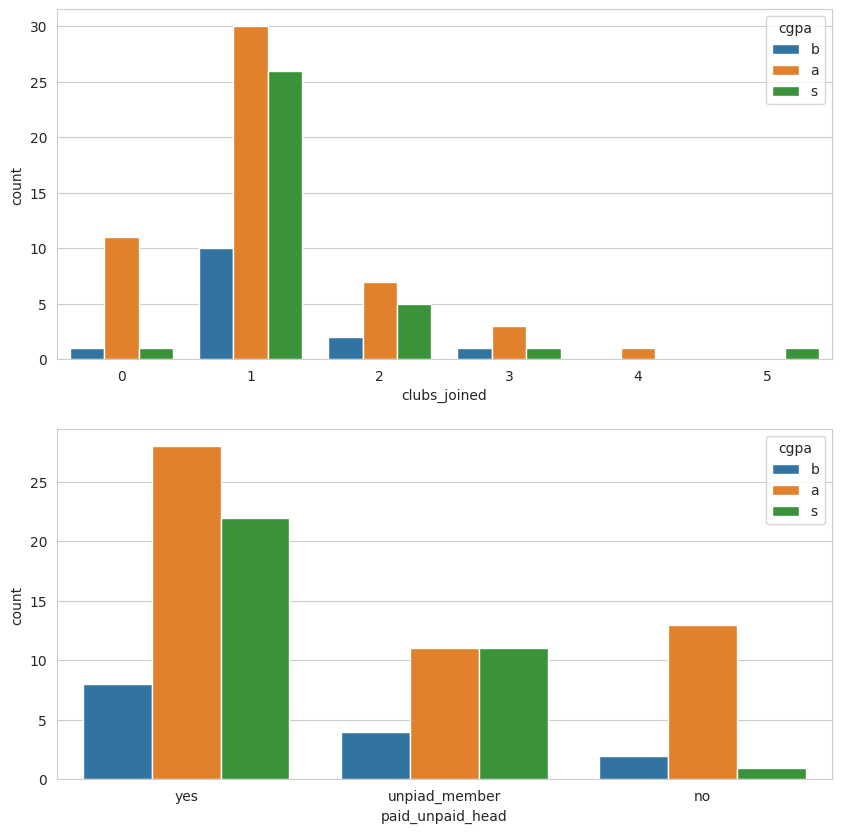

In [473]:
fig, (axis1, axis2)  = plt.subplots(2, 1,figsize=(10,10))

sns.countplot(x='clubs_joined', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis1)
sns.countplot(x='paid_unpaid_head', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis2)

<Axes: xlabel='fees', ylabel='count'>

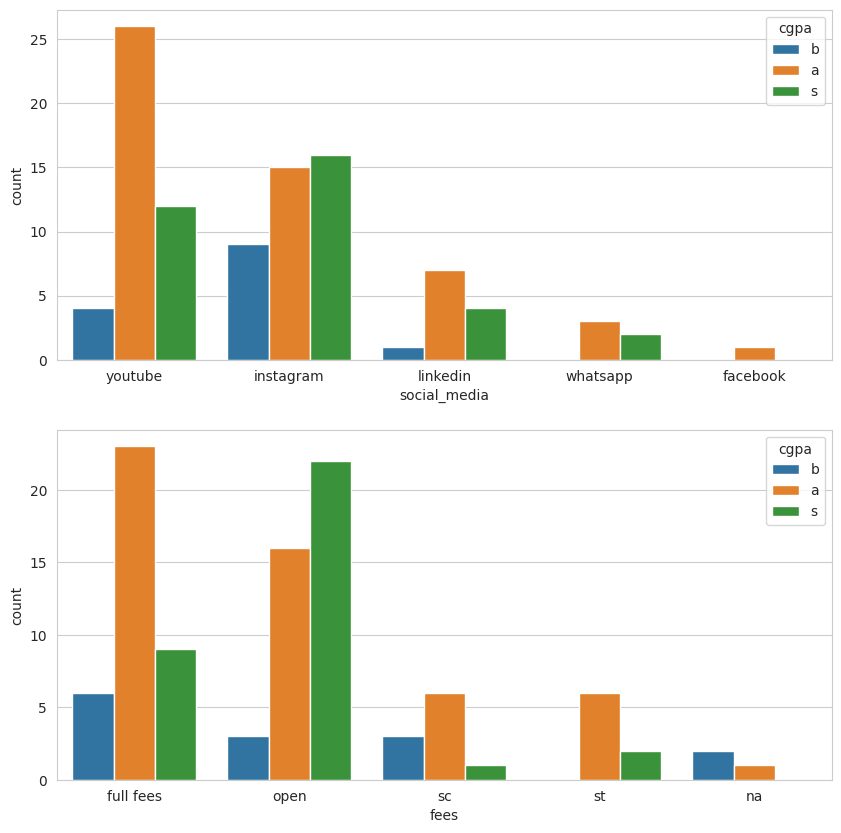

In [474]:
fig, (axis1, axis2)  = plt.subplots(2, 1,figsize=(10,10))

sns.countplot(x='social_media', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis1)
sns.countplot(x='fees', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis2)

<Axes: xlabel='diploma_percentage', ylabel='count'>

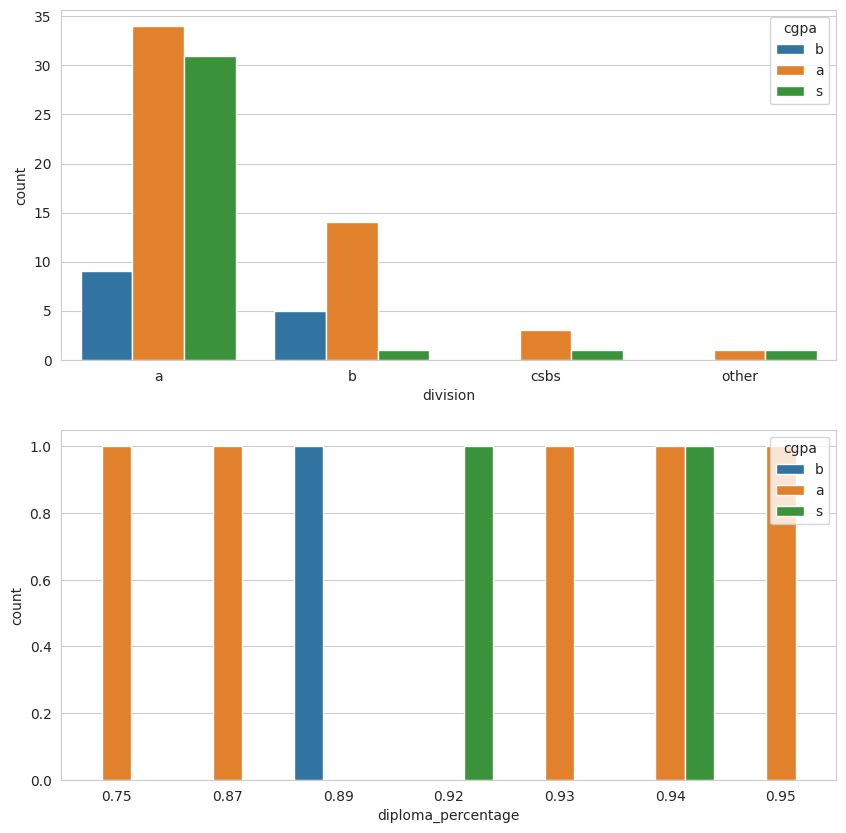

In [475]:
fig, (axis1, axis2)  = plt.subplots(2, 1,figsize=(10,10))

sns.countplot(x='division', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis1)
sns.countplot(x='diploma_percentage', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis2)

<Axes: xlabel='age', ylabel='count'>

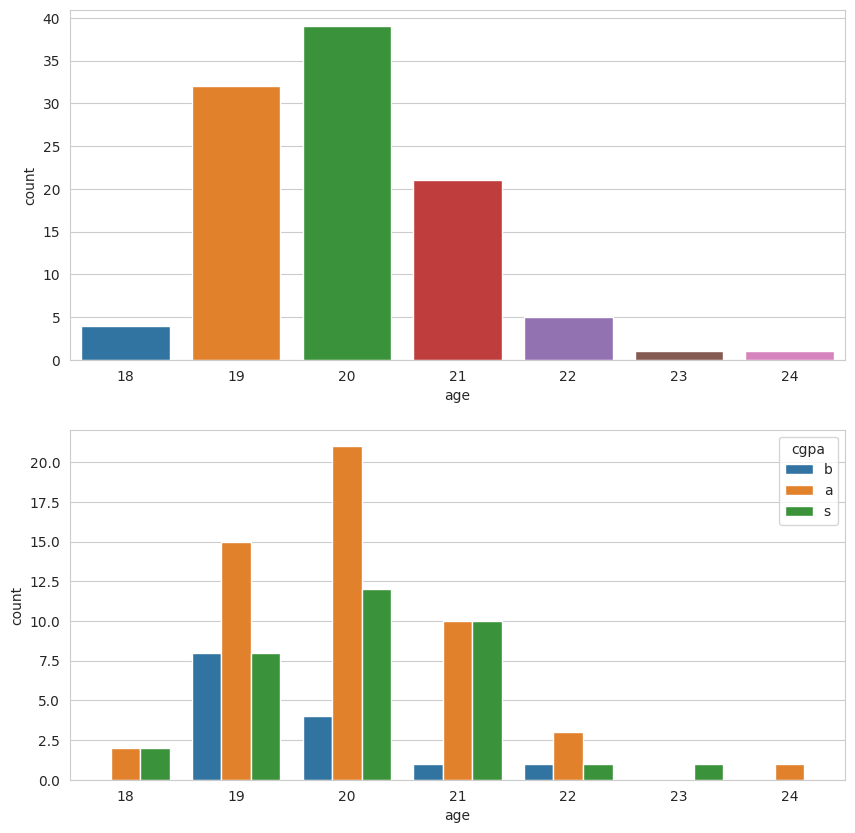

In [476]:
fig, (axis1, axis2)  = plt.subplots(2, 1,figsize=(10,10))

sns.countplot(x='age', data=df, ax=axis1)
sns.countplot(x='age', hue='cgpa', data=df,hue_order = ['b', 'a', 's'], ax=axis2)

In [477]:
# get unique values of 'col1'
unique_values = df['certification_platform'].unique()

# print the unique values
print(unique_values)


['udemy' 'coursera' 'other' 'coding ninja' 'linkedin learning']


In [478]:
import pandas as pd

# map the platform column to integer values
platform_map = {'udemy': 1, 'coursera': 2, 'other': 5, 'coding ninja': 3, 'linkedin learning': 4}
df['certification_platform'] = df['certification_platform'].replace(platform_map)

# print the updated DataFrame
print(df['certification_platform'])


0      1
1      1
2      1
3      1
4      1
      ..
98     1
99     1
100    1
101    5
102    1
Name: certification_platform, Length: 103, dtype: int64


In [479]:
# get unique values of 'col1'
unique_values = df['social_media'].unique()

# print the unique values
print(unique_values)

['youtube' 'instagram' 'linkedin' 'whatsapp' 'facebook']


In [480]:
import pandas as pd

# map the platform column to integer values
platform_map = {'youtube': 1, 'instagram': 2, 'facebook': 5, 'linkedin': 3, 'whatsapp': 4}
df['social_media'] = df['social_media'].replace(platform_map)

# print the updated DataFrame
print(df['social_media'])

0      1
1      2
2      2
3      1
4      1
      ..
98     1
99     2
100    2
101    1
102    3
Name: social_media, Length: 103, dtype: int64


In [499]:
Label = df['cgpa']
Features = df[['sgpa', 'percentage_10th', 'percentage_12th','certification_platform','social_media',
       'clubs_joined','avg_time_on_social_media']]

X = Features
y = Label
# split the data to 35% test,65% train with random state=42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=42)

In [500]:
X_train

,sgpa,percentage_10th,percentage_12th,certification_platform,social_media,clubs_joined,avg_time_on_social_media
78,0.85,0.89,0.89,5,2,3,3.0
65,0.82,0.60,0.70,5,2,0,0.8
35,0.92,0.89,0.88,4,1,1,3.0
16,0.82,0.88,0.87,1,2,1,2.0
91,0.85,0.95,0.77,1,4,5,2.0
...,...,...,...,...,...,...,...
71,0.91,0.91,0.81,1,1,2,2.0
14,0.79,0.80,0.81,1,2,1,1.0
92,0.91,0.89,0.76,1,2,1,2.0
51,0.98,0.95,0.90,1,1,2,1.5


In [501]:
X_test

,sgpa,percentage_10th,percentage_12th,certification_platform,social_media,clubs_joined,avg_time_on_social_media
30,0.83,0.91,0.87,1,1,2,1.00
67,0.94,0.88,0.72,1,2,1,1.00
62,0.93,0.87,0.82,4,3,2,2.00
47,0.88,0.91,0.76,2,3,0,1.00
42,0.83,0.92,0.67,5,1,1,2.50
40,0.83,0.91,0.77,2,2,1,2.00
90,0.89,0.92,0.93,1,2,1,3.00
45,0.93,0.93,0.78,2,2,2,4.00
10,0.87,0.82,0.91,1,3,1,2.00
0,0.81,0.90,0.85,1,1,3,2.00


In [502]:
y_train

78     a
65     a
35     s
16     a
91     s
      ..
71     a
14     b
92     s
51     s
102    a
Name: cgpa, Length: 66, dtype: object

In [503]:
y_test

30      a
67      s
62      a
47      a
42      a
40      s
90      s
45      s
10      a
0       a
18      a
31      a
97      s
85      a
76      s
4       a
79      a
33      a
12      a
26      s
100     s
53      b
22      a
68      a
44      a
98      a
15      s
73      a
39      a
9      na
84      s
11      a
101     a
55      a
28      b
64      b
5       s
Name: cgpa, dtype: object

Random forest

In [504]:
from sklearn.impute import SimpleImputer

# Replace missing values with the mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Train the model
rfe = RandomForestClassifier(n_estimators=500,random_state=42)
rfe.fit(X_train_imputed, y_train)

# Replace missing values with the mean in the test set
X_test_imputed = imputer.transform(X_test)

# Evaluate the model on the test set
y_pred = rfe.predict(X_test_imputed)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7297297297297297


In [505]:
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Replace missing values with the mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Perform feature selection on the training set
selector = SelectKBest(f_classif, k=2)
X_train_selected = selector.fit_transform(X_train_imputed, y_train)

# Train the model on the selected features
rfc = RandomForestClassifier(n_estimators=500, random_state=42)
rfc.fit(X_train_selected, y_train)

# Apply feature selection on the test set
X_test_imputed = imputer.transform(X_test)
X_test_selected = selector.transform(X_test_imputed)

# Evaluate the model on the test set
y_pred = rfc.predict(X_test_selected)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7297297297297297


In [506]:
from sklearn.impute import SimpleImputer

# Create an imputer object with median strategy
imp = SimpleImputer(strategy='median')

# Impute the missing values in training data
X_train_imputed = imp.fit_transform(X_train)

# Impute the missing values in testing data
X_test_imputed = imp.transform(X_test)

# Create a random forest classifier with imputed data
rfc = RandomForestClassifier(n_estimators=80,max_features='auto', max_depth=8,min_samples_leaf=1,
                             min_samples_split=2,bootstrap=True, random_state = 50)

# Fit the model using imputed data
rfc.fit(X_train_imputed, y_train)

# Predict using imputed data
rfcpred = rfc.predict(X_test_imputed)

# Calculate accuracy using imputed data
rfc.score(X_train_imputed, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



1.0

If the output of the code rfc.score(X_train,y_train) is 1.0, it means that the random forest classifier model has a perfect fit on the training data. In other words, the model has correctly predicted all the target variables in the training set. This can sometimes be a warning sign of overfitting, where the model has memorized the training data instead of learning the underlying patterns and relationships. It is important to evaluate the model's performance on unseen data, such as a validation or test set, to ensure that it can generalize well to new data.

Random Forest Classifier

              precision    recall  f1-score   support

           a       0.70      0.86      0.78        22
           b       0.67      0.67      0.67         3
          na       0.00      0.00      0.00         1
           s       0.71      0.45      0.56        11

    accuracy                           0.70        37
   macro avg       0.52      0.50      0.50        37
weighted avg       0.68      0.70      0.68        37



Confusion matrix


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<Axes: >

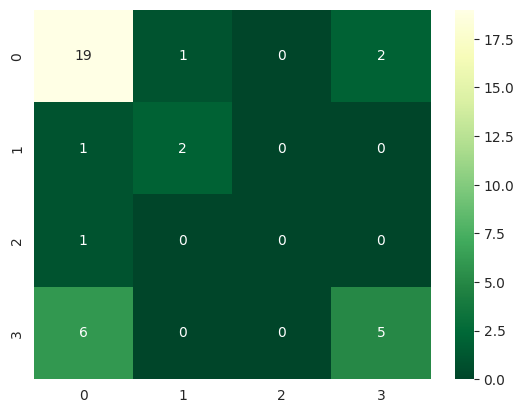

In [507]:
print('Random Forest Classifier' + '\n')
print(classification_report(y_test,rfcpred))

print('\n')

print('Confusion matrix')
sns.heatmap(confusion_matrix(y_test,rfcpred),cmap='YlGn_r',annot=True,fmt='g')


Decision Tree

In [508]:
from sklearn.impute import SimpleImputer

# create an instance of the SimpleImputer class
imputer = SimpleImputer(strategy='median')

# fit and transform the imputer on the training data
X_train_imputed = imputer.fit_transform(X_train)

# transform the imputer on the test data
X_test_imputed = imputer.transform(X_test)

# create a new decision tree classifier on the imputed data
dt = DecisionTreeClassifier(max_depth=7, min_samples_split=4, min_samples_leaf=1, random_state=1)
dt.fit(X_train_imputed, y_train)
dtpred = dt.predict(X_test_imputed)
dt.score(X_train_imputed, y_train)


0.9090909090909091

Desicion Tree Classifier

              precision    recall  f1-score   support

           a       0.82      0.64      0.72        22
           b       0.29      0.67      0.40         3
          na       0.00      0.00      0.00         1
           s       0.67      0.73      0.70        11

    accuracy                           0.65        37
   macro avg       0.44      0.51      0.45        37
weighted avg       0.71      0.65      0.67        37



Confusion matrix


<Axes: >

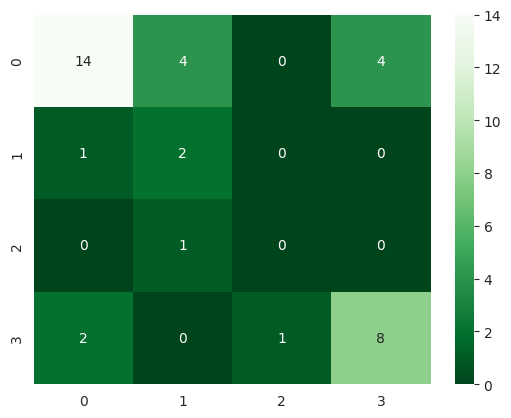

In [509]:
print('Desicion Tree Classifier' + '\n')
print(classification_report(y_test,dtpred))

print('\n')

print('Confusion matrix')
sns.heatmap(confusion_matrix(y_test,dtpred),cmap='Greens_r',annot=True,fmt='g')

SVC

In [510]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC

from sklearn.preprocessing import StandardScaler

pipeline = make_pipeline(
    SimpleImputer(),
    StandardScaler(),
    SVC(C=300, gamma=1, random_state=53)
)


# fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# make predictions on the test set
y_pred = pipeline.predict(X_test)

# calculate accuracy
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7027027027027027


In [511]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

# create a pipeline that replaces missing values with the mean, selects features using random forest, and trains an SVC
pipeline = make_pipeline(
    SimpleImputer(),
    SelectFromModel(RandomForestClassifier(n_estimators=100)),
    SVC(C=300, gamma=1, random_state=53)
)

# fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# make predictions on the test set
y_pred = pipeline.predict(X_test)

# calculate accuracy
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7567567567567568


Support Vector Classifier

              precision    recall  f1-score   support

           a       0.74      0.77      0.76        22
           b       0.25      0.33      0.29         3
          na       0.00      0.00      0.00         1
           s       0.70      0.64      0.67        11

    accuracy                           0.68        37
   macro avg       0.42      0.44      0.43        37
weighted avg       0.67      0.68      0.67        37



Confusion matrix


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<Axes: >

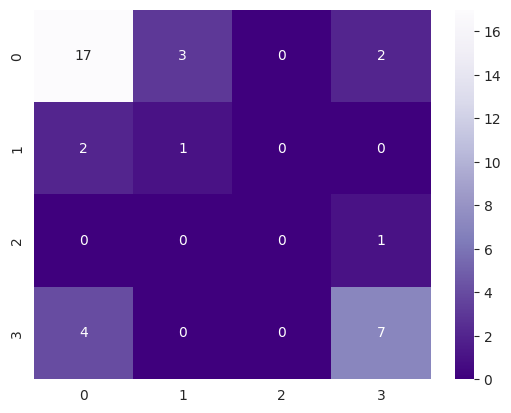

In [512]:
print('Support Vector Classifier' + '\n')
print(classification_report(y_test,svcpred))

print('\n')

print('Confusion matrix')
sns.heatmap(confusion_matrix(y_test,svcpred),cmap='Purples_r',annot=True,fmt='g')

KNN

In [513]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import HistGradientBoostingClassifier

# create a pipeline that replaces missing values with the mean and trains a HistGradientBoostingClassifier
pipeline = make_pipeline(
    SimpleImputer(strategy='mean'),
    HistGradientBoostingClassifier()
)

# fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# make predictions on the test set
y_pred = pipeline.predict(X_test)

# calculate accuracy
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7027027027027027


In [514]:
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

# create pipeline that replaces missing values with the mean and trains a KNN classifier
pipeline = make_pipeline(SimpleImputer(), KNeighborsClassifier(n_neighbors=21, p=10))

# fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# make predictions on the test set
y_pred = pipeline.predict(X_test)

# calculate accuracy
accuracy = pipeline.score(X_test, y_test)
print(f"Accuracy: {accuracy}")


Accuracy: 0.6486486486486487


K-Nearest Neighbors

              precision    recall  f1-score   support

           a       0.63      1.00      0.77        22
           b       0.00      0.00      0.00         3
          na       0.00      0.00      0.00         1
           s       1.00      0.18      0.31        11

    accuracy                           0.65        37
   macro avg       0.41      0.30      0.27        37
weighted avg       0.67      0.65      0.55        37



Confusion matrix


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<Axes: >

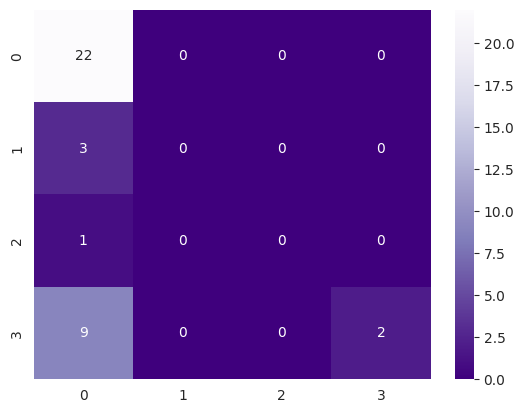

In [515]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# create a pipeline that replaces missing values with the mean and trains a KNN classifier
pipeline = make_pipeline(SimpleImputer(), KNeighborsClassifier(n_neighbors=21, p=10))

# fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# make predictions on the test set
knnpred = pipeline.predict(X_test)

# print the classification report
print('K-Nearest Neighbors' + '\n')
print(classification_report(y_test, knnpred))
print('\n')

# print the confusion matrix
print('Confusion matrix')
sns.heatmap(confusion_matrix(y_test, knnpred), cmap='Purples_r', annot=True, fmt='g')


<Axes: >

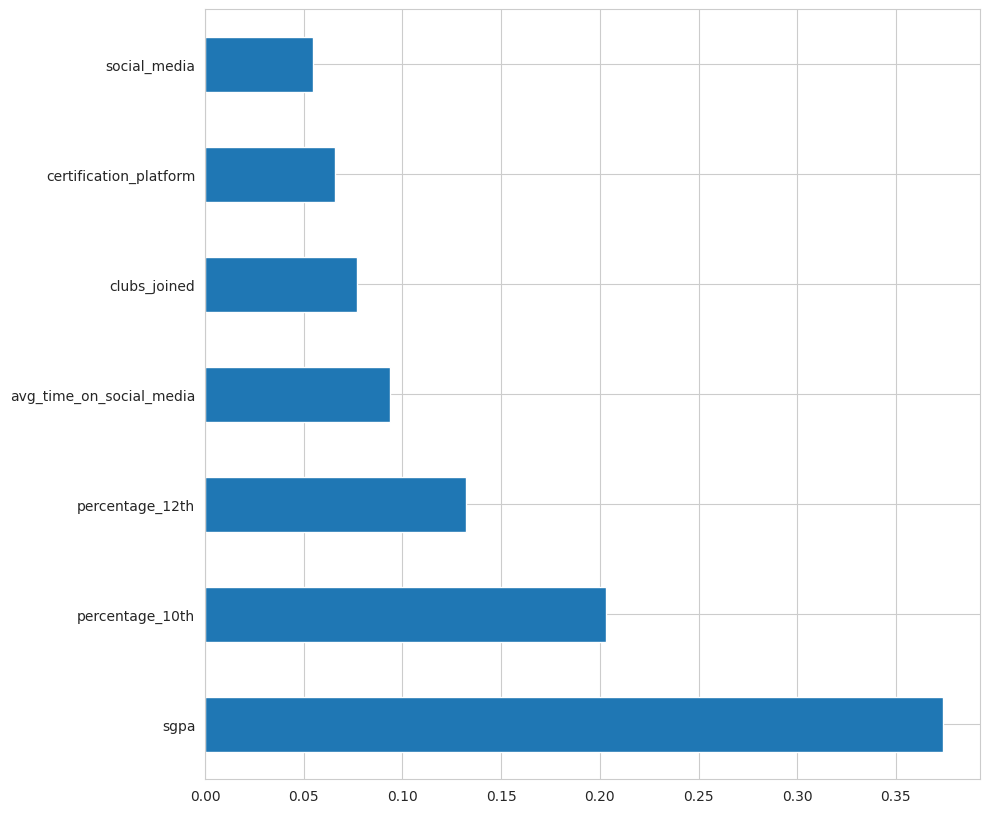

In [516]:
plt.figure(figsize=(10,10))
importance = pd.Series(rfc.feature_importances_,index=Features.columns)
importance.nlargest(15).plot(kind='barh')